In [1]:
suppressMessages(library(tidyr))
suppressMessages(library(dplyr))
suppressMessages(library(pheatmap))
suppressMessages(library(ggplot2))
suppressMessages(library(patchwork))
suppressMessages(library(ggtree))
suppressMessages(library(hash))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(ggalluvial))
suppressMessages(library(grid))
suppressMessages(library(ggrepel))
suppressMessages(library(ggdark))
suppressMessages(library(tidyverse))
suppressMessages(library(ggrastr))
suppressMessages(library(ggpubr))
suppressMessages(library(readxl))
suppressMessages(library(ggsci))
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(circlize))
suppressMessages(library(aplot))
suppressMessages(library(Seurat))
suppressMessages(library(gridExtra))
suppressMessages(library(rstatix))

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”


# Figure 1B

In [2]:
dat=as.data.frame(read_xls("GF_SPF_phenotype_statistic.xls",col_types = c("guess")))

In [3]:
for(i in colnames(dat)[4:9]){
    print(i)
    dat[,i] <- as.numeric(dat[,i])
}

[1] "small_int"


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] "large_int"


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] "cecum"
[1] "liver"


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] "thymus"


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] "spleen"


Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


In [4]:
plst <- list()
for(i in colnames(dat)[c(3:7,9,8)]){
    # print(i)
    data <- na.omit(dat[,c(colnames(dat)[2],i)])
    y_max <- max(data[,i])
    plst[[i]] <- ggviolin(data, x = "mice", y = i ,fill = "mice", palette =c("#B33E52", "darkgray"),
            dd = "boxplot")+stat_compare_means(method = "wilcox.test",
                                             ref.group = "SPF",
                                              label = "p.signif",size = 5) + 
        theme(axis.text.y = element_text(size = 20,margin  = margin(0,10,0,0)),
            axis.text.x = element_text(size = 20,margin  = margin(10,0,0,0)),
            axis.title.x= element_blank(),
            axis.title.y= element_text(size = 30,margin  = margin(0,15,0,0)),
            legend.text = element_text(size = 18),
            legend.title = element_text(size = 25))
} 

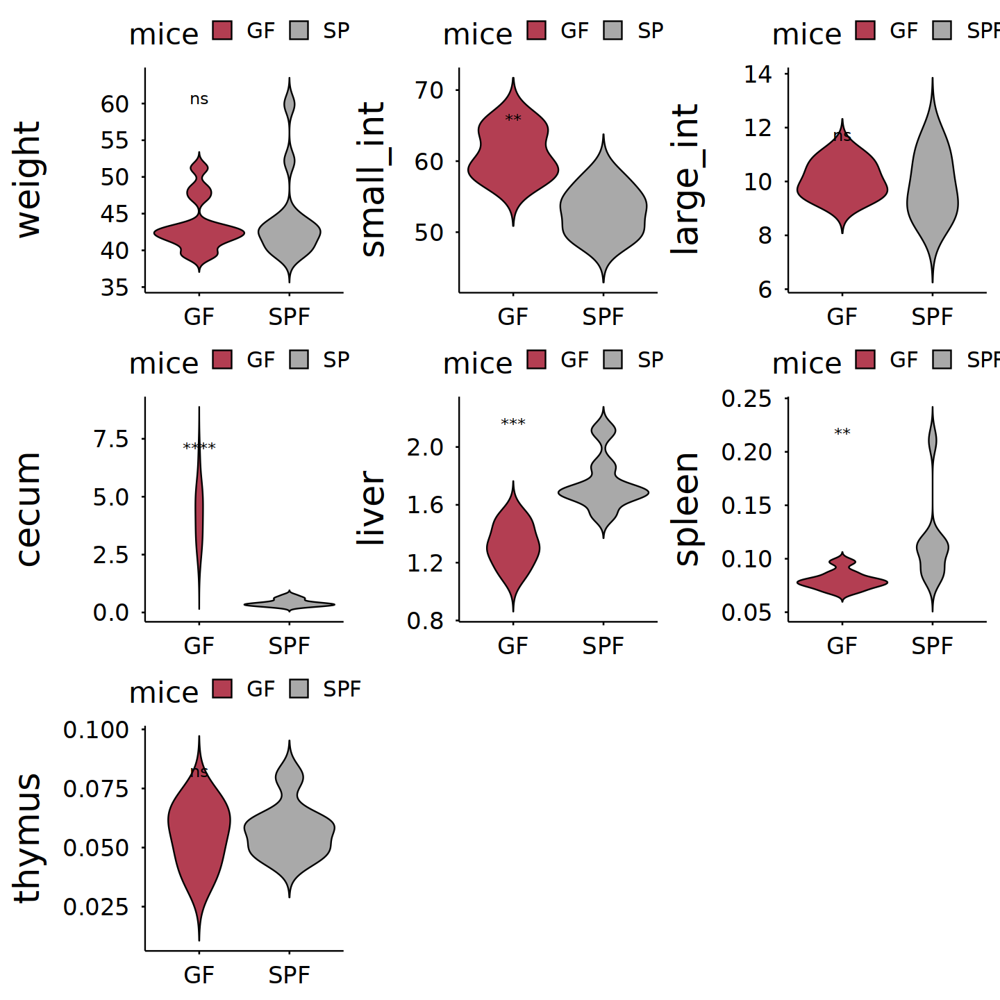

In [5]:
options(repr.plot.width = 12,repr.plot.height= 12)
p <-  wrap_plots(plst,ncol=3)
p

In [6]:
pdf(file = "Figure_1B_phenotype_Vinplot.pdf",w = 12,h = 12)
print(p)
dev.off()

png 
  2

# Figure 1C 

In [2]:
DimPlot_custom <- function(object,vars,clusters,mycolor,label.size,title = NULL,legend = NULL){
        data <- data.frame(x = 0,y =0)
        p.arrow <- ggplot(data = data,aes(x = x,y = y)) + geom_point(size=2, alpha=1) + 
            geom_segment(aes(,x = x , y = y , xend = x +4, yend = y ), colour = "black",
                     size=0.5,arrow = arrow(length = unit(0.5,"cm")))+ 
            geom_segment(aes(x = x  , y = y , xend = x , yend =y + 4), colour = "black", 
                     size=0.5,arrow = arrow(length = unit(0.5,"cm"))) +
            annotate("text", x = data$x+2, y =data$y-1, label = "tSNE_1", color="black",
                 size = 4,fontface="bold" ) + 
            annotate("text", x = data$x-1, y =data$y + 2, label = "tSNE_2",color="black",
                 size = 4, fontface="bold" ,angle=90) + theme_bw()+
            theme(plot.margin=unit(c(0.1, 0.1, 0.1, 0.1), "inches"),legend.title=element_blank()) +
                theme(panel.grid.major = element_blank(), #主网格线
                panel.grid.minor = element_blank(), #次网格线
                panel.border = element_blank(), #边框
                axis.title = element_blank(),  #轴标题
                axis.text = element_blank(), # 文本
                axis.ticks = element_blank())
        plot.data <- FetchData(object,vars = vars)
        plot.data$clusters <- as.character(plot.data$clusters) # !!!
        plot.data <- plot.data %>% mutate(celltype2 = paste(clusters,celltypes,sep = " "))
        plot.data$celltype2 <- factor(plot.data$celltype2,levels = clusters$celltype)
        centers <- plot.data %>% group_by(clusters) %>% summarise(tSNE_1 = median(tSNE_1),tSNE_2 = median(tSNE_2)) %>%
                as.data.frame() 
        theme_self <- theme(plot.margin=unit(c(0.1, 0.1, 0.1, 0.1), "inches"),legend.title=element_blank()) +
                   theme(panel.grid.major = element_blank(), #主网格线
                   panel.grid.minor = element_blank(), #次网格线
                   panel.border = element_blank(), #边框
                   axis.title = element_blank(),  #轴标题
                   axis.text = element_blank(), # 文本
                   axis.ticks = element_blank(),plot.title = element_text(size =25,hjust = 0.5,
                                                                          family = "Times",face = "bold"))
        if(is.null(legend)){
            theme_self <-theme_self + theme(legend.position = "none")
        } else {
            theme_self <- theme_self + theme(legend.text=element_text(colour="black",size=12),legend.position="right",
                          plot.title=element_text(hjust=0.5))
        }
        p <- ggplot(data=plot.data,aes(x=tSNE_1, y=tSNE_2))+
            geom_point_rast(alpha=0.2, size=0.0000000001,aes(colour=celltype2)) +
            guides(colour=guide_legend(override.aes=list(size=5,alpha = 1)))+
            scale_color_manual(values=mycolor)+
            theme_bw()+
            labs(x= "tSNE_1",y="tSNE_2",title= title) + theme_self +  
             geom_point(data=centers, mapping=aes(x=tSNE_1, y=tSNE_2), size=0, alpha=0) + 
             geom_text(data=centers, mapping=aes(label=clusters), size=label.size, fontface="plain")
        p <- p + inset_element(p.arrow,left = 0,bottom = 0,right = 0.2,top = 0.2,align_to= "full",on_top = TRUE)
        return(p)                                                        
}

In [3]:
All4 <- readRDS("whole_final_annotation.rds")
clusters <- All4@meta.data %>% select(clusters,celltypes) %>% arrange(clusters) %>% 
    mutate(celltype = paste(clusters,celltypes,sep = " "))
Annot <- clusters[!duplicated(clusters),]

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


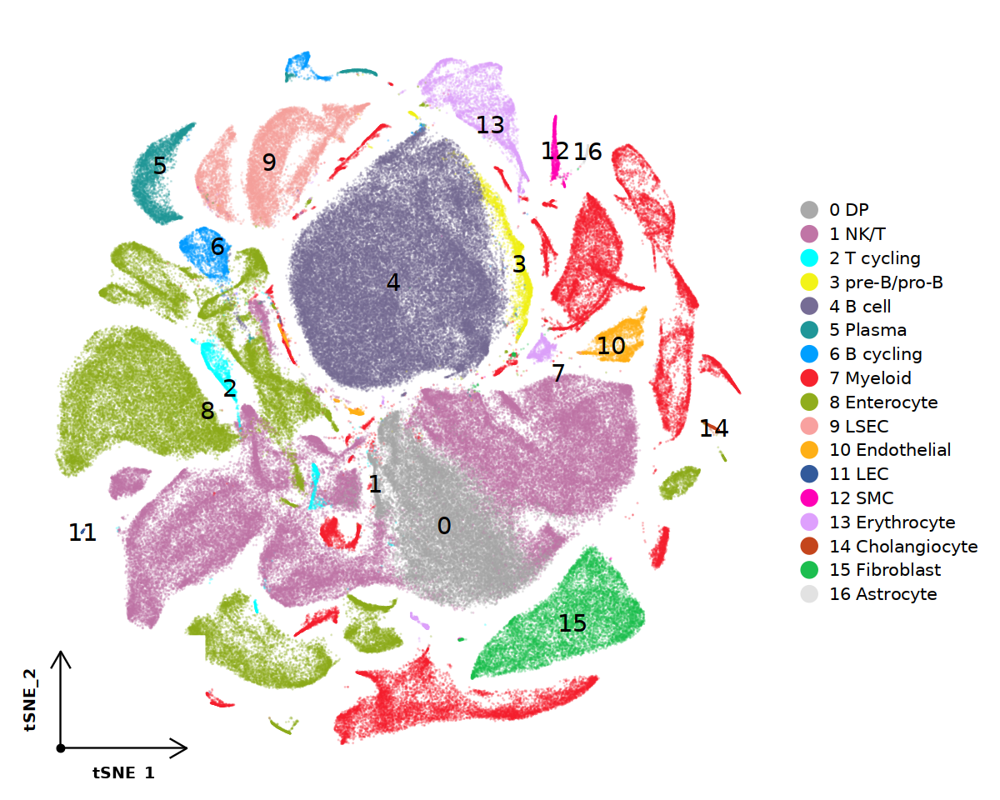

In [4]:
options(repr.plot.width = 10,repr.plot.height= 8)
mycolor <- c("darkgray","#C075A6","cyan","#F2F318","#766C95","#1F9698","#009FFF",
             "#F6222E","#90AD1C","#F8A19F","#FEAF16","#325A9B","#FF00B6","#DEA0FD",
             "#C4451C","#1CBE4F","#E2E2E2","#F7E1A0","#B3823E")
p <- DimPlot_custom(object = All4,vars = c("tSNE_1","tSNE_2","clusters","celltypes"),clusters = Annot,
                mycolor = mycolor,label.size = 6,legend = TRUE)
p 

In [5]:
pdf(file = "Figure_1C_mian_umap.pdf",w = 10,h = 8)
print(p)
dev.off()

png 
  2

# Figure 1D

In [6]:
GetMergeTable <- function(object,var){
    #print(object)
    whole <- as.data.frame.array(table(object@meta.data$celltypes,object@meta.data$mice))
    #print(whole)
    Idents(object) <- var
    for( i in unique(object@meta.data[,var])){
        #print(i)
        subObj <- subset(object, idents = i)
        tissue_table <- as.data.frame.array(table(subObj@meta.data$celltypes,subObj@meta.data$mice))
        tissue_prefix <- rep(i,2)
        table_newnames <- paste(colnames(tissue_table),tissue_prefix,sep = "_")
        colnames(tissue_table) <- table_newnames  # ?
        whole <- cbind(whole,tissue_table)
    }
    return(whole)
}
CellRadioNumPlot <- function(object,var,tissue_levels,mycolor = NULL,levels = NULL){
    CellNum2 <- GetMergeTable(object,var)
    CellNum2 <- CellNum2[,3:18]
    # Radio #
    CellNum.p <- as.data.frame(proportions(as.matrix(CellNum2),margin = 2) * 100)
    CellNum.p$celltypes <- rownames(CellNum.p)
    CellNum.pt <- melt(CellNum.p,id.vars= "celltypes")
    colnames(CellNum.pt) <- c("celltypes","variable","Composition")
    # cell num #
    rownames(CellNum2) <- NULL
    Tissue_CellNum <- as.data.frame(colSums(CellNum2))
    Tissue_CellNum$tissue <- rownames(Tissue_CellNum)
    colnames(Tissue_CellNum) <- c('num','tissue')
    if(!is.null(levels)){
            CellNum.pt$celltypes <- factor(CellNum.pt$celltypes,levels = levels)  # celltype  levels color 
    } else {
        print('No level!')
    }
    CellNum.pt$variable <- factor(CellNum.pt$variable,levels = tissue_levels) # tissue levels x axis #
    Tissue_CellNum$tissue <- factor(Tissue_CellNum$tissue,levels = tissue_levels)
    if(is.null(mycolor)){
        nclu <- length(rownames(CellNum.p))
        mycolor = colorRampPalette(brewer.pal(9, "Set1"))(nclu)
    } else {
        print(mycolor)
     }
    
    # Radio #
    p1 <- ggplot(CellNum.pt,aes(x = variable,y = Composition,fill= celltypes,stratum = celltypes,alluvium = celltypes)) + 
            geom_col(width = 0.5,color= "black") +  coord_flip() +
            geom_flow(width = 0.5,alpha = 0.4, knot.pos=0.5) + theme_classic() + labs(x = " " , y = "Composition (%)") +  
    scale_fill_manual(values=mycolor) + theme(
            axis.text.y = element_text(size = 20,face = "bold",margin  = margin(0,10,0,0)),
            axis.text.x = element_text(size = 20,face = "bold",margin  = margin(10,0,0,0)),
            axis.title.x= element_text(size = 30,face = "bold",margin  = margin(15,0,0,0)),
            axis.title.y= element_text(size = 30,face = "bold",margin  = margin(0,15,0,0)),
             axis.line = element_line(linetype = 1,color= "black",size = 1),
            legend.text = element_text(size = 18,face = "bold"),
             legend.title = element_text(size = 25,face = "bold"),
           axis.ticks  = element_line(color = "black",size = 1,lineend = 2))
    # cell num #
    p2 <- ggplot(Tissue_CellNum,aes(x = tissue, y = num)) +  
                geom_bar(stat = "identity",position = "stack",width = 0.5) +
                theme_classic() + labs(x = "" , y = "Cell Number") +
                scale_fill_manual(values=mycolor) + theme(
                    axis.text.y = element_blank(),
                    axis.text.x = element_text(size = 20,face = "bold", # family = "Times"
                                           margin = margin(10,0,0,0)),
                    axis.title.x = element_text(margin  = margin(15,0,0,0)),
                    axis.title.y = element_text(margin  = margin(0,15,0,0)),
                    axis.title= element_text(size = 30,face = "bold"), # ,family = "Times"
                    axis.line = element_line(linetype = 1,color= "black",size = 1),
                    legend.text = element_text(size = 18 ,face = "bold"), # ,family = "Times"
                    legend.title = element_text(size = 25,face = "bold"),# family = "Times"
                    axis.ticks.y = element_blank(),
                    axis.ticks.x = element_line(color = "black",size = 1,lineend = 2)) + coord_flip() +
                            scale_y_continuous(breaks = c(0,10000,20000,30000),
                           labels = c("0","10k","20k","30k"))
    p.me <- p1 + p2 + plot_layout(width = c(3,1),guides = 'collect')
    return(p.me)
} 

In [7]:
mycolor <- c("darkgray","#C075A6","cyan","#F2F318","#766C95","#1F9698","#009FFF",
             "#F6222E","#90AD1C","#F8A19F","#FEAF16","#325A9B","#FF00B6","#DEA0FD",
             "#C4451C","#1CBE4F","#E2E2E2","#F7E1A0","#B3823E")

In [8]:
immune <- subset(All4,idents = c(0,1,2,3,4,5,6,7))
Idents(immune) <- "celltypes"
immune@meta.data$celltypes <- Idents(immune)
Annot_immnue <- Annot[1:8,]
Annot_immnue$celltypes <- as.vector(Annot_immnue$celltypes)
tissue_levels <- c("SPF_cecum","GF_cecum","SPF_colon","GF_colon",
                   "SPF_ileum","GF_ileum", "SPF_liver","GF_liver",
                   "SPF_thymus","GF_thymus","SPF_spleen","GF_spleen",
                   "SPF_bm","GF_bm","SPF_blood","GF_blood")                 
p <- CellRadioNumPlot(object = immune,var = "tissue",mycolor = mycolor,
       tissue_levels = tissue_levels,levels = Annot_immnue$celltypes)  
date()

 [1] "darkgray" "#C075A6"  "cyan"     "#F2F318"  "#766C95"  "#1F9698" 
 [7] "#009FFF"  "#F6222E"  "#90AD1C"  "#F8A19F"  "#FEAF16"  "#325A9B" 
[13] "#FF00B6"  "#DEA0FD"  "#C4451C"  "#1CBE4F"  "#E2E2E2"  "#F7E1A0" 
[19] "#B3823E" 


Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


[1] "Wed Jan 15 01:18:13 2025"

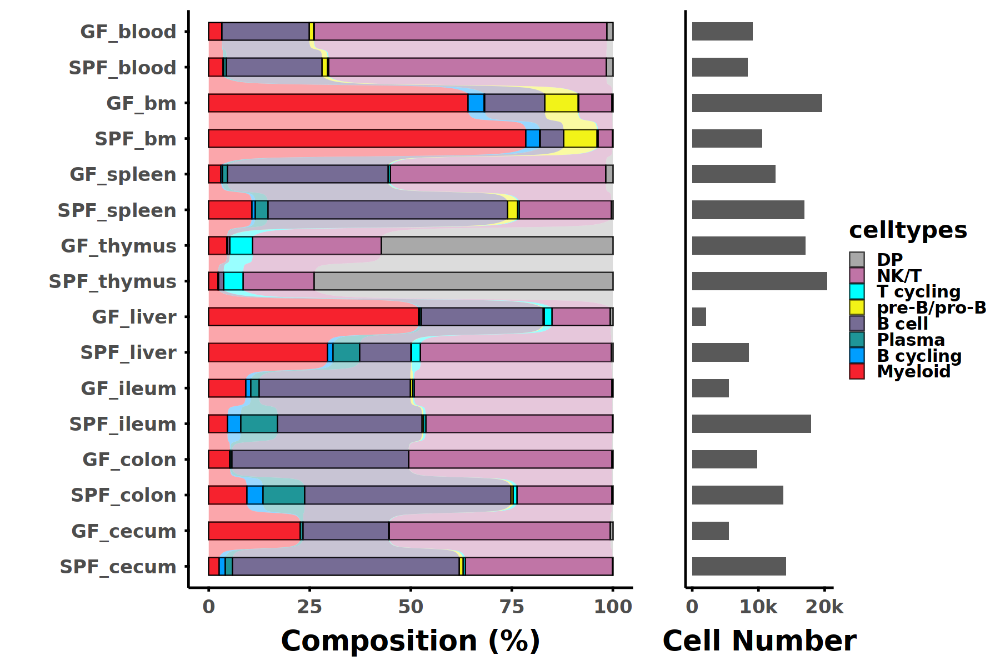

In [9]:
options(repr.plot.width = 15,repr.plot.height= 10)
p

In [10]:
pdf(file = "Figure_1D_immune_stat.pdf",w = 15,h = 10)
print(p)
dev.off()

png 
  2

# Figure 1# python Kernel

In [1]:
import datetime
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
import warnings
import os
from matplotlib.colors import ListedColormap
from matplotlib.gridspec import GridSpec
import pickle
datetime.datetime.now().strftime('%c')

'Wed Jan 15 01:30:51 2025'

In [160]:
def get_rgb_function(cmap, min_value, max_value):
    r"""Generate a function to map continous values to RGB values using colormap between min_value & max_value."""

    if min_value > max_value:
        raise ValueError("Max_value should be greater or than min_value.")

    if min_value == max_value: 
        warnings.warn(
            "Max_color is equal to min_color. It might be because of the data or bad parameter choice. "
            "If you are using plot_contours function try increasing max_color_quantile parameter and"
            "removing cell types with all zero values."
        )

        def func_equal(x):
            factor = 0 if max_value == 0 else 0.5
            return cmap(np.ones_like(x) * factor)

        return func_equal

    def func(x):
        return cmap((np.clip(x, min_value, max_value) - min_value) / (max_value - min_value))

    return func 

def rgb_to_ryb(rgb):
    """
    Converts colours from RGB colorspace to RYB

    Parameters
    ----------

    rgb
        numpy array Nx3

    Returns
    -------
    Numpy array Nx3
    """
    rgb = np.array(rgb)
    if len(rgb.shape) == 1:
        rgb = rgb[np.newaxis, :]

    white = rgb.min(axis=1)
    black = (1 - rgb).min(axis=1)
    rgb = rgb - white[:, np.newaxis]

    yellow = rgb[:, :2].min(axis=1)
    ryb = np.zeros_like(rgb)
    ryb[:, 0] = rgb[:, 0] - yellow
    ryb[:, 1] = (yellow + rgb[:, 1]) / 2
    ryb[:, 2] = (rgb[:, 2] + rgb[:, 1] - yellow) / 2

    mask = ~(ryb == 0).all(axis=1)
    if mask.any():
        norm = ryb[mask].max(axis=1) / rgb[mask].max(axis=1)
        ryb[mask] = ryb[mask] / norm[:, np.newaxis]

    return ryb + black[:, np.newaxis]

def ryb_to_rgb(ryb):
    """
    Converts colours from RYB colorspace to RGB

    Parameters
    ----------

    ryb
        numpy array Nx3

    Returns
    -------
    Numpy array Nx3
    """
    ryb = np.array(ryb)
    if len(ryb.shape) == 1:
        ryb = ryb[np.newaxis, :]

    black = ryb.min(axis=1)
    white = (1 - ryb).min(axis=1)
    ryb = ryb - black[:, np.newaxis]

    green = ryb[:, 1:].min(axis=1)
    rgb = np.zeros_like(ryb)
    rgb[:, 0] = ryb[:, 0] + ryb[:, 1] - green
    rgb[:, 1] = green + ryb[:, 1]
    rgb[:, 2] = (ryb[:, 2] - green) * 2

    mask = ~(ryb == 0).all(axis=1)
    if mask.any():
        norm = rgb[mask].max(axis=1) / ryb[mask].max(axis=1)
        rgb[mask] = rgb[mask] / norm[:, np.newaxis]

    return rgb + white[:, np.newaxis]

# add function of gradient custom # 
def gradient(start_color,end_color,num_steps):
    '''
    Generates a list of gradient colors between two colors
    :parameter 
         start_color : The RGB value of the starting color
         end_color : The RGB value of the ending color
         num_steps : num of gradient colors 
    :return 
        gradient_colors : list of gradient colors
    '''
    r = np.linspace(start_color[0],end_color[0],num_steps)/255
    g = np.linspace(start_color[1],end_color[1],num_steps)/255
    b = np.linspace(start_color[2],end_color[2],num_steps)/255
    # value of RGB to lsit of 
    gradient_colors = np.array([[r[i],g[i],b[i],1]for i in range(num_steps)])
    gradient_colors[:,3] = np.repeat(0.7,num_steps)
    
    return gradient_colors


# plot # 
def plot_spatial_general1(
    value_df,
    coords,
    labels,
    min_intensity = None, # accept number !  
    max_intensity = None,
    text=None,
    circle_diameter=4.0,
    alpha_scaling=1.0,
    max_col=(np.inf, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
    max_color_quantile=0.98,
    show_img=True,
    img=None,
    img_alpha=1.0,
    adjust_text=False,
    plt_axis="off",
    axis_y_flipped=True,
    x_y_labels=("", ""),
    crop_x=None,
    crop_y=None,
    text_box_alpha=0.9,
    reorder_cmap=range(7),
    style="fast",
    colorbar_position="bottom",
    colorbar_label_kw={},
    colorbar_shape={},
    colorbar_tick_size=12,
    colorbar_grid=None,
    image_cmap="Greys_r",
    white_spacing=20,  
): 
    r"""Plot spatial abundance of cell types (regulatory programmes) with colour gradient and interpolation.

      This method supports only 7 cell types with these colours (in order, which can be changed using reorder_cmap).
      'yellow' 'orange' 'blue' 'green' 'purple' 'grey' 'white'

    :param value_df: pd.DataFrame - with cell abundance or other features (only 7 allowed, columns) across locations (rows)
    :param coords: np.ndarray - x and y coordinates (in columns) to be used for ploting spots
    :param text: pd.DataFrame - with x, y coordinates, text to be printed
    :param circle_diameter: diameter of circles
    :param labels: list of strings, labels of cell types
    :param 
    :param alpha_scaling: adjust color alpha
    :param max_col: crops the colorscale maximum value for each column in value_df.
    :param max_color_quantile: crops the colorscale at x quantile of the data.
    :param show_img: show image?
    :param img: numpy array representing a tissue image.
        If not provided a black background image is used.
    :param img_alpha: transparency of the image
    :param lim: x and y max limits on the plot. Minimum is always set to 0, if `lim` is None maximum
        is set to image height and width. If 'no_limit' then no limit is set.
    :param adjust_text: move text label to prevent overlap
    :param plt_axis: show axes?
    :param axis_y_flipped: flip y axis to match coordinates of the plotted image
    :param reorder_cmap: reorder colors to make sure you get the right color for each category

    :param style: plot style (matplolib.style.context):
        'fast' - white background & dark text;
        'dark_background' - black background & white text;

    :param colorbar_position: 'bottom', 'right' or None
    :param colorbar_label_kw: dict that will be forwarded to ax.set_label()
    :param colorbar_shape: dict {'vertical_gaps': 1.5, 'horizontal_gaps': 1.5,
                                    'width': 0.2, 'height': 0.2}, not obligatory to contain all params
    :param colorbar_tick_size: colorbar ticks label size
    :param colorbar_grid: tuple of colorbar grid (rows, columns)
    :param image_cmap: matplotlib colormap for grayscale image
    :param white_spacing: percent of colorbars to be hidden
    :param color_gradient : TURE of FALSE # lwm add 2024 - 1 - 10
    """
    if value_df.shape[1] > 7: 
        raise ValueError("Maximum of 7 cell types / factors can be plotted at the moment")

    def create_colormap(R, G, B):
        spacing = int(white_spacing * 2.55)

        # N = 255
        N = 510 # spleen
        M = 3

        alphas = np.concatenate([[0] * spacing * M, np.linspace(0, 1.0, (N - spacing) * M)])

        vals = np.ones((N * M, 4))
        #         vals[:, 0] = np.linspace(1, R / 255, N * M)
        #         vals[:, 1] = np.linspace(1, G / 255, N * M)
        #         vals[:, 2] = np.linspace(1, B / 255, N * M)
        for i, color in enumerate([R, G, B]):
            vals[:, i] = color / 255
        vals[:, 3] = alphas

        return ListedColormap(vals)

   
    YellowCM = create_colormap(240, 228, 66)  
    RedCM = create_colormap(213, 94, 0)  
    BlueCM = create_colormap(86, 180, 233)  
    GreenCM = create_colormap(0, 158, 115)  
    GreyCM = create_colormap(200, 200, 200)  
    WhiteCM = create_colormap(50, 50, 50)  
    PurpleCM = create_colormap(90, 20, 165)  
    GreenCM2 = create_colormap(139,251,122) 

    cmaps = [YellowCM, RedCM, BlueCM, GreenCM, PurpleCM,GreyCM, WhiteCM, GreenCM2]

    cmaps = [cmaps[i] for i in reorder_cmap]
    
    with mpl.style.context(style):
        fig = plt.figure()

        if colorbar_position == "right":
            if colorbar_grid is None:
                colorbar_grid = (len(labels), 1)

            shape = {"vertical_gaps": 1.5, "horizontal_gaps": 0, "width": 0.15, "height": 0.2}
            shape = {**shape, **colorbar_shape}

            gs = GridSpec(
                nrows=colorbar_grid[0] + 2,
                ncols=colorbar_grid[1] + 1,
                width_ratios=[1, *[shape["width"]] * colorbar_grid[1]],
                height_ratios=[1, *[shape["height"]] * colorbar_grid[0], 1],
                hspace=shape["vertical_gaps"],
                wspace=shape["horizontal_gaps"],
            )
            ax = fig.add_subplot(gs[:, 0], aspect="equal", rasterized=True)

        if colorbar_position == "bottom":
            if colorbar_grid is None:
                if len(labels) <= 3:
                    colorbar_grid = (1, len(labels))
                else:
                    n_rows = round(len(labels) / 3 + 0.5 - 1e-9)
                    colorbar_grid = (n_rows, 3)

            shape = {"vertical_gaps": 0.3, "horizontal_gaps": 0.6, "width": 0.2, "height": 0.035}
            shape = {**shape, **colorbar_shape}

            gs = GridSpec(
                nrows=colorbar_grid[0] + 1,
                ncols=colorbar_grid[1] + 2,
                width_ratios=[0.3, *[shape["width"]] * colorbar_grid[1], 0.3],
                height_ratios=[1, *[shape["height"]] * colorbar_grid[0]],
                hspace=shape["vertical_gaps"],
                wspace=shape["horizontal_gaps"],
            )

            ax = fig.add_subplot(gs[0, :], aspect="equal", rasterized=True)

        if colorbar_position is None:
            ax = fig.add_subplot(aspect="equal", rasterized=True)

        if colorbar_position is not None:
            cbar_axes = []
            for row in range(1, colorbar_grid[0] + 1):
                for column in range(1, colorbar_grid[1] + 1):
                    cbar_axes.append(fig.add_subplot(gs[row, column]))

            n_excess = colorbar_grid[0] * colorbar_grid[1] - len(labels)
            if n_excess > 0:
                for i in range(1, n_excess + 1):
                    cbar_axes[-i].set_visible(False)

        ax.set_xlabel(x_y_labels[0])
        ax.set_ylabel(x_y_labels[1])

        if img is not None and show_img:
            ax.imshow(img, aspect="equal", alpha=img_alpha, origin="lower", cmap=image_cmap)

        # crop images in needed
        if crop_x is not None:
            ax.set_xlim(crop_x[0], crop_x[1])
        if crop_y is not None:
            ax.set_ylim(crop_y[0], crop_y[1])

        if axis_y_flipped:
            ax.invert_yaxis()

        if plt_axis == "off":
            for spine in ax.spines.values():
                spine.set_visible(False)
            ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)

        counts = value_df.values.copy() 

        # plot spots as circles
        # print(counts.shape[1])
        c_ord = list(np.arange(0, counts.shape[1]))

        colors = np.zeros((*counts.shape, 4))
        weights = np.zeros(counts.shape)
        
        for c in c_ord:
            print("c: ",c) # lwm
            if isinstance(min_intensity, list):
                min_int = min_intensity[c]
            else :
                min_int = min_intensity
                
            if isinstance(max_intensity, list):
                max_int = max_intensity[c]
            else :
                max_int = max_intensity
            
            if min_int is not None:
                min_color_intensity = min_intensity[c] # 2024 - 2 - 23
            else:
                print(c,"min color intesity is None ! ")
                min_color_intensity = counts[:, c].min()  
            if max_int is not None: 
                max_color_intensity = max_intensity[c] #  2024 - 2 - 23
            else:
                print(c,"max color intensity is None ! ") 
                max_color_intensity = np.min([np.quantile(counts[:, c], max_color_quantile), max_col[c]]) 
            print("min_color_intensity : ",min_color_intensity)
            print("max_color_intensity : ",max_color_intensity)
            
            rgb_function = get_rgb_function(cmap=cmaps[c], min_value=min_color_intensity, max_value=max_color_intensity)
           
            color = rgb_function(counts[:, c])
            color[:, 3] = color[:, 3] * alpha_scaling
            
           
            norm = mpl.colors.Normalize(vmin=min_color_intensity, vmax=max_color_intensity) 
   
                
            if colorbar_position is not None:
                cbar_ticks = [
                    min_color_intensity,
                    np.mean([min_color_intensity, max_color_intensity]),
                    max_color_intensity,
                ]
                cbar_ticks = np.array(cbar_ticks)

                if max_color_intensity > 13:
                    cbar_ticks = cbar_ticks.astype(np.int32)
                else:
                    cbar_ticks = cbar_ticks.round(2)
 
                cbar = fig.colorbar(
                    mpl.cm.ScalarMappable(norm=norm, cmap= cmaps[c]), 
                    cax=cbar_axes[c],
                    orientation="horizontal",
                    extend="both",
                    ticks=cbar_ticks,
                ) 

                cbar.ax.tick_params(labelsize=colorbar_tick_size)
                max_color = rgb_function(max_color_intensity / 1.5)
                cbar.ax.set_title(labels[c], **{**{"size": 20, "color": max_color, "alpha": 1}, **colorbar_label_kw})

            colors[:, c] = color
            weights[:, c] = np.clip(counts[:, c] / (max_color_intensity + 1e-10), 0, 1)
            weights[:, c][counts[:, c] < min_color_intensity] = 0

        colors_ryb = np.zeros((*weights.shape, 3))

        for i in range(colors.shape[0]):
            colors_ryb[i] = rgb_to_ryb(colors[i, :, :3])

        def kernel(w):
            return w**2
        
        # gene expression color spot #
        kernel_weights = kernel(weights[:, :, np.newaxis])
        
        # warning # RuntimeWarning: invalid value encountered in true_divide # 
        weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)

        weighted_colors = np.zeros((weights.shape[0], 4))

        weighted_colors[:, :3] = ryb_to_rgb(weighted_colors_ryb)

        weighted_colors[:, 3] = colors[:, :, 3].max(axis=1)
        
        ax.scatter(x=coords[:, 0], y=coords[:, 1], c=weighted_colors, s=circle_diameter**2)
        
        # add text
        if text is not None:
            bbox_props = dict(boxstyle="round", ec="0.5", alpha=text_box_alpha, fc="w")
            texts = []
            for x, y, s in zip(
                np.array(text.iloc[:, 0].values).flatten(),
                np.array(text.iloc[:, 1].values).flatten(),
                text.iloc[:, 2].tolist(),
            ):
                texts.append(ax.text(x, y, s, ha="center", va="bottom", bbox=bbox_props))

            if adjust_text:
                from adjustText import adjust_text

                adjust_text(texts, arrowprops=dict(arrowstyle="->", color="w", lw=0.5))

    return fig,ax
datetime.datetime.now().strftime('%c')

'Wed Jan 15 03:34:30 2025'

In [9]:
def add_ScaleRuler(fig,x,y,length,size,label,lw,local,background):
    r'''
    :para fig: main plot 
    :para x: x axis position of scale ruler
    :para y: y axis position of scale ruler 
    :para length: length of scale ruler
    :para size:  y axis high of scale ruler
    :para label: unit of scale ruler ,Default : "10μm" 
    :para lw: line width,Default : 2
    '''
    if background == "dark_background":
        color = 'white'
    elif background == "fast":
        color = 'black'
    ax = fig.get_axes()
    
    ax[0].hlines(y= y,  xmin = x, xmax = x+length, colors="yellow", ls="-", lw=lw)

    return(fig)

def CreateParaDict(Filelist,Samplelist,Genelist,NoneGenelist,AllGene,
                   Celltypes,SpotSize,Colorlist,Output):
    r'''
    :parameter Filelist : list
    :parameter Samplelist : list
    :parameter NoneGenelist : list
    :parameter Genelist : list 
    :parameter AllGene : list
    :parameter Celltypes : list
    :parameter SpotSize : list
    :parameter Colorlist: list 
    :parameter Output : str
    ...
    '''
    ParaDict = {'filelist' : Filelist,
                'samplelist': Samplelist,
                'NoneGenelist': NoneGenelist,
                'Genelist': Genelist,
                'AllGene': AllGene, 
                'Celltypes': Celltypes,
                'SpotSize': SpotSize,
                'Colorlist': Colorlist,
                'Output': Output}
    return(ParaDict)
datetime.datetime.now().strftime('%c') 

'Wed Jan 15 01:40:41 2025'

In [5]:
def MutilGeneExperssion(ParaDict,min_intensity,max_intensity,Figsize = (8,4),
                        Style = 'dark_background',ColorBarSize = 6,ColorbarTickSize = 6,size=60,
                        ruler_length = 400,label = "200 μm",lw = 4,x_shift = 500,
                        y_local = 600,method = "single"):
    r'''
    :parameter ParaDict : dict
    :parameter min_intensity : 
    :parameter max_intensity : 
    :parameter Figsize : tuple
    :parameter CircleDiameter : number 
    :parameter ColorBarSize : number
    :parameter Style : plot style (matplolib.style.context):
                          'fast' - white background & dark text;
                          'dark_background' - black background & white text;
    :parameter ColorbarTickSize : 
    :parameter size : 
    :parameter ruler.length : 
    :parameter label : 
    :parameter lw : 
    :parameter x.shift :
    :parameter y.local : 
    :parameter method : 
    '''
  
    # parameter #
    filelist = ParaDict['filelist']
    samplelist = ParaDict['samplelist']
    NoneGenelist = ParaDict['NoneGenelist']
    Genelist = ParaDict['Genelist']
    AllGene = ParaDict['AllGene']
    Celltypes = ParaDict['Celltypes']
    Colorlist = ParaDict['Colorlist']
    SpotSize = ParaDict['SpotSize']
    Output = ParaDict['Output']
    
    for i in range(0,len(samplelist)):
        file = filelist[i]
        sample = samplelist[i]
        print("sample: ",sample) # sample
        out = output + "/" + sample
        print(out)
        if(os.path.exists(out)):
            print("Project Exist!")
        else :
            os.mkdir(out) # out project
        
        # input #
        adata = sc.read_h5ad(file)
        sc.pp.normalize_total(adata, target_sum=1e4) # normalize #
        sc.pp.log1p(adata) # log1p #
   
        adata.var.index = adata.var['features']
        GeneExp  = adata.to_df().copy()
        
        # change y axis #
        adata.obs[['y']] = - adata.obs[["y"]] # notice # 
        adata.obsm['spatial'] = adata.obs[["x","y"]].values
        coord = adata.obsm["spatial"]
        
        # Get All Experssion Gene #
        NoneGene = NoneGenelist[i] # NoneGene 
        gene = list(set(AllGene).difference(NoneGene)) # All Experssion Gene 
        gene2 = pd.DataFrame(gene).drop_duplicates()[0].to_list() # duplicate #
        
        # Gene Experssion data.frame #
        GeneExp = GeneExp[gene2]
        
        # celltypes #
        # genelist #
        
        if method == "single": # score or single gene expression   
            print("single")
            for j in range(0,len(Genelist)):
                print(j)
                ct = Celltypes[j] # each celltypes 
                gene3 = Genelist[j]
                genel = list(set(gene3).difference(NoneGene)) # Get each celltypes Experssion Gene 
                CircleDiameter = SpotSize[j]
                color = Colorlist[j]
                if len(genel) > 1 : # cal gene exp score 
                    print("genel: ",genel)
                    score_str = ct + "_score"
                    sc.tl.score_genes(adata,gene_list = genel,
                                    score_name = score_str,use_raw = False) # warnning # 
                    marker = [score_str]
                    GeneExp2 = adata.obs[score_str].to_frame() # only one gene list score
                    
                else :
                    marker = genel
                    GeneExp2 = GeneExp[genel]
               
                print(GeneExp2)
                
                plt.rcParams["figure.figsize"] = Figsize # 
                fig, ax = plot_spatial_general1(value_df=GeneExp2, coords=adata.obsm["spatial"],
                                min_intensity = min_intensity,
                                max_intensity = max_intensity,
                                labels=marker, circle_diameter= CircleDiameter, 
                                style = Style, reorder_cmap = color,
                                colorbar_position="right", 
                                colorbar_tick_size=ColorbarTickSize, 
                                colorbar_label_kw={"size":ColorBarSize}, max_color_quantile=1, img_alpha=1) # 1
                ax.scatter(coord[:,0], coord[:,1], color="#E0E0E0", marker=".", zorder=0, s=0.1)
                fig = add_ScaleRuler(fig = fig,x=adata.obs["x"].max() + x_shift,y=adata.obs["y"].max(),
                                      length = ruler_length,size=size,label=label,lw=lw,background = Style,
                                      local = y_local)
                
        elif method == 'multiple': # multiple Gene Expression # single gene expression  
            print("multiple")
            ct = Celltypes
            CircleDiameter = SpotSize
            color = Colorlist
            genel = list(set(Genelist).difference(NoneGene))
            marker = genel
            GeneExp2 = GeneExp[genel]
            
            print(GeneExp2)

            plt.rcParams["figure.figsize"] = Figsize # 
            
            fig, ax = plot_spatial_general1(value_df=GeneExp2, coords=adata.obsm["spatial"], 
                                min_intensity = min_intensity,
                                max_intensity = max_intensity,
                                labels=marker, circle_diameter= CircleDiameter, 
                                style = Style, reorder_cmap = color,
                                colorbar_position="right", 
                                colorbar_tick_size=ColorbarTickSize,  
                                colorbar_label_kw={"size":ColorBarSize}, max_color_quantile=1, img_alpha=1) 
            ax.scatter(coord[:,0], coord[:,1], color="#E0E0E0", marker=".", zorder=0, s=0.1)

            fig = add_ScaleRuler(fig = fig,x=adata.obs["x"].max() + x_shift ,y=adata.obs["y"].max(),
                                      length = ruler_length,size = size,label=label,background = Style,
                                      lw=lw,local = y_local)
            
            
        else : 
            print("Please check your method!") 
        
        output_fig = out + '/' + sample + "_" + ct + "_gene.pdf"
        print(output_fig)
        fig.savefig(output_fig,dpi = 512)
        print("--- end ----")
        return(fig)
datetime.datetime.now().strftime('%c') 

'Wed Jan 15 01:31:09 2025'

## ileum 

### Myeloid score 

In [50]:
genelist = [['Cd163','C1qa','C1qb','C1qc']]
Allgene = ['Cd163','C1qa','C1qb','C1qc']
Celltypes = ['Myeloid']
SpotSize = [3] # 1
Colorlist = [[0]]
min_intensity = [-0.6]
max_intensity = [3.3]

In [51]:
filelist  = ['GF_ileum1_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_ileum1"] 
NoneGenelist =[[]] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_ileum1
/data/work/08_plot/Figure1/Figure1E/GF_ileum1
single
0
genel:  ['C1qb', 'C1qc', 'Cd163', 'C1qa']
                       Myeloid_score
GF_ileum1:10180_21640      -0.057714
GF_ileum1:10300_21820      -0.075959
GF_ileum1:10360_21100      -0.017352
GF_ileum1:10840_21860      -0.055197
GF_ileum1:10500_22040      -0.037698
...                              ...
GF_ileum1:11680_20220       0.000000
GF_ileum1:10800_21080       0.000000
GF_ileum1:10780_21060      -0.028016
GF_ileum1:10700_21460       0.000000
GF_ileum1:10360_22240      -0.031339

[4830 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  3.3


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_ileum1/GF_ileum1_Myeloid_gene.pdf
--- end ----


'Wed Jan 15 02:22:53 2025'

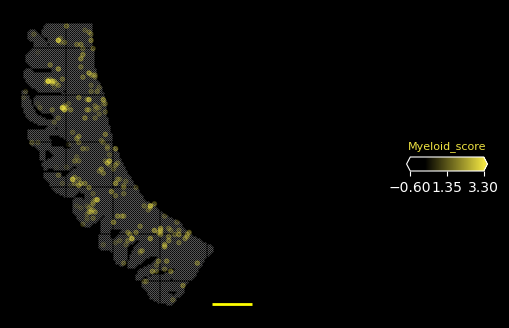

In [52]:
fig1

In [53]:
filelist  = ['SPF_ileum2_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_ileum2"]
NoneGenelist =[[]] 

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_ileum2
/data/work/08_plot/Figure1/Figure1E/SPF_ileum2
single
0
genel:  ['C1qb', 'C1qc', 'Cd163', 'C1qa']
                       Myeloid_score
SPF_ileum3:7980_25280      -0.056051
SPF_ileum3:6660_25240      -0.078323
SPF_ileum3:6340_25100      -0.096282
SPF_ileum3:8360_24980      -0.074325
SPF_ileum3:8460_25040      -0.038807
...                              ...
SPF_ileum3:7060_25140       0.000000
SPF_ileum3:6260_24920       0.000000
SPF_ileum3:7620_25000       0.000000
SPF_ileum3:6280_24920       0.000000
SPF_ileum3:8220_24940       0.000000

[3487 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  3.3


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_ileum2/SPF_ileum2_Myeloid_gene.pdf
--- end ----


'Wed Jan 15 02:23:08 2025'

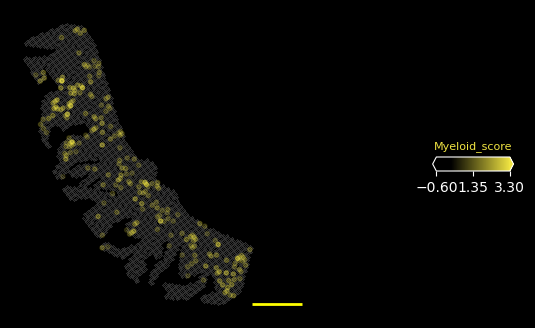

In [54]:
fig2

### NK/T cell score 

In [55]:
genelist = [['Cd28','Cd3e','Cd3d','Trbc1','Trbc2','Trac','Foxp3','Il22','Cd4','Cd8a',
             'Cd8b1','Ctla4','Il17a','Il13','Il4','Il9r','Il17rb','Trdc','Tcrg-C2',
             'Tcrg-C4','Ccl4','Ccl3','Ccl5','Xcl1','Ifng','Klrk1','Klrd1']]
Allgene = ['Cd28','Cd3e','Cd3d','Trbc1','Trbc2','Trac','Foxp3','Il22','Cd4','Cd8a',
             'Cd8b1','Ctla4','Il17a','Il13','Il4','Il9r','Il17rb','Trdc','Tcrg-C2',
             'Tcrg-C4','Ccl4','Ccl3','Ccl5','Xcl1','Ifng','Klrk1','Klrd1']
Celltypes = ['NK_T cell']
SpotSize = [3] # 1 
Colorlist = [[0]]
min_intensity = [-0.1]
max_intensity = [0.55]

In [56]:
filelist  = ['GF_ileum1_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_ileum1"] 
NoneGenelist =[['Il9r', 'Il22', 'Klrk1', 'Il13', 'Ifng', 'Cd8b1', 'Ccl3', 'Il17a', 'Ccl4']] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_ileum1
/data/work/08_plot/Figure1/Figure1E/GF_ileum1
Project Exist!
single
0
genel:  ['Cd4', 'Trbc2', 'Klrd1', 'Cd3e', 'Xcl1', 'Ctla4', 'Il17rb', 'Tcrg-C4', 'Trdc', 'Trbc1', 'Cd8a', 'Trac', 'Foxp3', 'Cd28', 'Ccl5', 'Il4', 'Tcrg-C2', 'Cd3d']
                       NK_T cell_score
GF_ileum1:10180_21640        -0.007843
GF_ileum1:10300_21820        -0.006633
GF_ileum1:10360_21100        -0.006997
GF_ileum1:10840_21860        -0.004719
GF_ileum1:10500_22040         0.000000
...                                ...
GF_ileum1:11680_20220         0.000000
GF_ileum1:10800_21080         0.000000
GF_ileum1:10780_21060         0.000000
GF_ileum1:10700_21460         0.000000
GF_ileum1:10360_22240         0.000000

[4830 rows x 1 columns]
c:  0
min_color_intensity :  -0.1
max_color_intensity :  0.55


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:224: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_ileum1/GF_ileum1_NK_T cell_gene.pdf
--- end ----


'Wed Jan 15 02:23:42 2025'

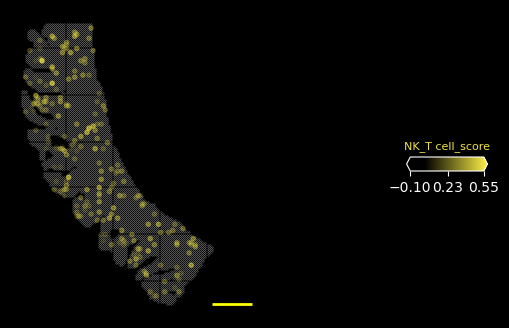

In [57]:
fig1

In [58]:
filelist  = ['SPF_ileum2_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_ileum2"]
NoneGenelist =[['Il22', 'Il13', 'Cd28', 'Ifng', 'Ccl3', 'Il17a']] 

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_ileum2
/data/work/08_plot/Figure1/Figure1E/SPF_ileum2
Project Exist!
single
0
genel:  ['Cd4', 'Trbc2', 'Il9r', 'Klrd1', 'Cd3e', 'Xcl1', 'Ctla4', 'Klrk1', 'Il17rb', 'Tcrg-C4', 'Trdc', 'Trbc1', 'Cd8a', 'Trac', 'Foxp3', 'Cd8b1', 'Ccl5', 'Il4', 'Ccl4', 'Tcrg-C2', 'Cd3d']
                       NK_T cell_score
SPF_ileum3:7980_25280        -0.005377
SPF_ileum3:6660_25240        -0.008781
SPF_ileum3:6340_25100        -0.009491
SPF_ileum3:8360_24980        -0.005695
SPF_ileum3:8460_25040        -0.015348
...                                ...
SPF_ileum3:7060_25140         0.000000
SPF_ileum3:6260_24920        -0.007981
SPF_ileum3:7620_25000         0.000000
SPF_ileum3:6280_24920        -0.009218
SPF_ileum3:8220_24940         0.000000

[3487 rows x 1 columns]
c:  0
min_color_intensity :  -0.1
max_color_intensity :  0.55


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_ileum2/SPF_ileum2_NK_T cell_gene.pdf
--- end ----


'Wed Jan 15 02:24:07 2025'

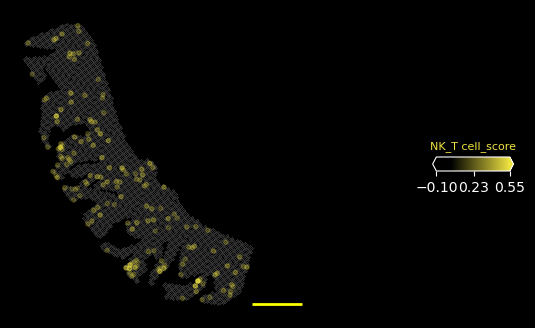

In [59]:
fig2

### Plasma score 

In [60]:
genelist = [['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']]
Allgene = ['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']
Celltypes = ['Plasma']
SpotSize = [1]  
Colorlist = [[0]]
min_intensity = [-0.6]
max_intensity = [4.3]

In [61]:
filelist  = ['GF_ileum1_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_ileum1"] 
NoneGenelist =[['Ighg2c']] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_ileum1
/data/work/08_plot/Figure1/Figure1E/GF_ileum1
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3']
                       Plasma_score
GF_ileum1:10180_21640     -0.011411
GF_ileum1:10300_21820     -0.114158
GF_ileum1:10360_21100     -0.201310
GF_ileum1:10840_21860     -0.306776
GF_ileum1:10500_22040      1.559323
...                             ...
GF_ileum1:11680_20220      0.000000
GF_ileum1:10800_21080      1.140428
GF_ileum1:10780_21060      0.000000
GF_ileum1:10700_21460     -0.035766
GF_ileum1:10360_22240      0.000000

[4830 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  4.3


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_ileum1/GF_ileum1_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:24:32 2025'

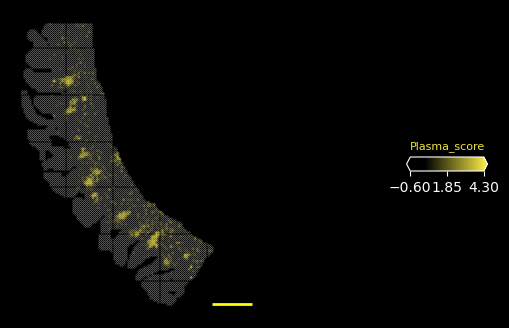

In [62]:
fig1

In [63]:
filelist  = ['SPF_ileum2_bin20.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_ileum2"]
NoneGenelist =[['Ighg1']] 

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 400,label = "200 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_ileum2
/data/work/08_plot/Figure1/Figure1E/SPF_ileum2
Project Exist!
single
0
genel:  ['Ighg2b', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']
                       Plasma_score
SPF_ileum3:7980_25280     -0.137640
SPF_ileum3:6660_25240     -0.204117
SPF_ileum3:6340_25100      0.377229
SPF_ileum3:8360_24980     -0.199569
SPF_ileum3:8460_25040      0.540048
...                             ...
SPF_ileum3:7060_25140      0.000000
SPF_ileum3:6260_24920     -0.055008
SPF_ileum3:7620_25000     -0.027883
SPF_ileum3:6280_24920     -0.059548
SPF_ileum3:8220_24940     -0.034800

[3487 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  4.3


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_ileum2/SPF_ileum2_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:24:45 2025'

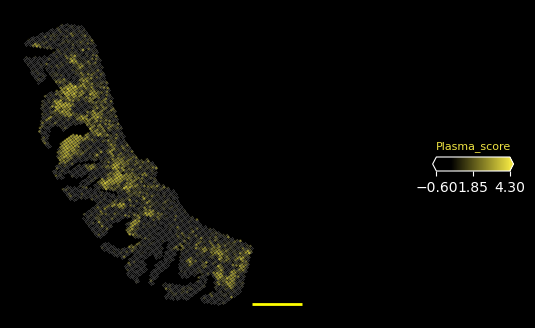

In [64]:
fig2

##  colon 

### Myeloid score 

In [65]:
genelist = [['Cd163','C1qa','C1qb','C1qc']]
Allgene = ['Cd163','C1qa','C1qb','C1qc']
Celltypes = ['Myeloid']
SpotSize = [3] #  1
Colorlist = [[0]]
min_intensity = [-0.6]
max_intensity = [3.3]

In [66]:
filelist  = ['GF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_colon"]
NoneGenelist =[[]] # fibroblast
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_colon
/data/work/08_plot/Figure1/Figure1E/GF_colon
single
0
genel:  ['C1qb', 'C1qc', 'Cd163', 'C1qa']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Myeloid_score
GF:15880_11500       0.653633
GF:16680_12800      -0.046848
GF:19260_11780      -0.117921
GF:17740_10840       0.516676
GF:19000_14220      -0.151037
...                       ...
GF:18780_12240       0.000000
GF:16560_11980       0.000000
GF:17500_11580       0.000000
GF:19440_14080       0.000000
GF:18020_11280       0.000000

[23254 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  3.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_colon/GF_colon_Myeloid_gene.pdf
--- end ----


'Wed Jan 15 02:25:22 2025'

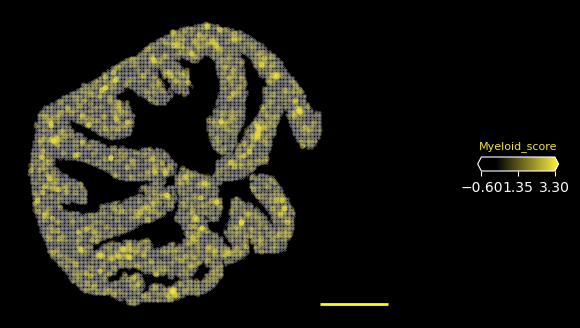

In [67]:
fig1

In [69]:
filelist  = ['SPF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_colon"]
NoneGenelist =[[]] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_colon
/data/work/08_plot/Figure1/Figure1E/SPF_colon
Project Exist!
single
0
genel:  ['C1qb', 'C1qc', 'Cd163', 'C1qa']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Myeloid_score
SPF:5260_23960      -0.114612
SPF:8240_19180      -0.098094
SPF:8440_18900       1.085888
SPF:5260_24080       0.495013
SPF:7840_23780      -0.240566
...                       ...
SPF:7620_23360       0.000000
SPF:7000_23800       0.000000
SPF:8160_19200       0.000000
SPF:5600_22900       0.000000
SPF:6220_22600       0.000000

[33515 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  3.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_colon/SPF_colon_Myeloid_gene.pdf
--- end ----


'Wed Jan 15 02:26:43 2025'

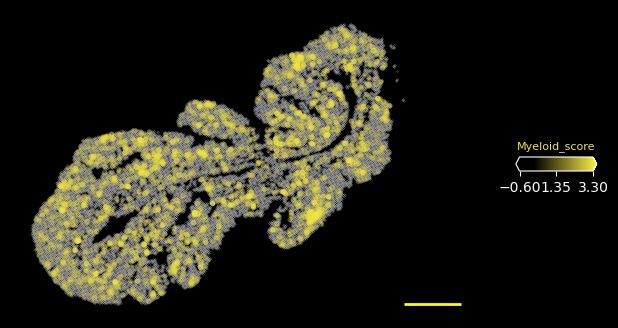

In [70]:
fig2

### NK/T cell score 

In [71]:
genelist = [['Cd28','Cd3e','Cd3d','Trbc1','Trbc2','Trac','Foxp3','Il22','Cd4','Cd8a',
             'Cd8b1','Ctla4','Il17a','Il13','Il4','Il9r','Il17rb','Trdc','Tcrg-C2',
             'Tcrg-C4','Ccl4','Ccl3','Ccl5','Xcl1','Ifng','Klrk1','Klrd1']]
Allgene = ['Cd28','Cd3e','Cd3d','Trbc1','Trbc2','Trac','Foxp3','Il22','Cd4','Cd8a',
             'Cd8b1','Ctla4','Il17a','Il13','Il4','Il9r','Il17rb','Trdc','Tcrg-C2',
             'Tcrg-C4','Ccl4','Ccl3','Ccl5','Xcl1','Ifng','Klrk1','Klrd1']
Celltypes = ['NK_T cell']
SpotSize = [2] # 1
Colorlist = [[0]]
min_intensity = [-0.1]
max_intensity = [0.55]

In [72]:
filelist  = ['GF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_colon"]
NoneGenelist =[['Il22', 'Il13', 'Ifng', 'Ccl3', 'Il17a', 'Il4']]
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_colon
/data/work/08_plot/Figure1/Figure1E/GF_colon
Project Exist!
single
0
genel:  ['Cd4', 'Trbc2', 'Il9r', 'Klrd1', 'Cd3e', 'Xcl1', 'Ctla4', 'Klrk1', 'Il17rb', 'Tcrg-C4', 'Trdc', 'Trbc1', 'Cd8a', 'Trac', 'Foxp3', 'Cd28', 'Cd8b1', 'Ccl5', 'Ccl4', 'Tcrg-C2', 'Cd3d']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                NK_T cell_score
GF:15880_11500        -0.058960
GF:16680_12800        -0.015577
GF:19260_11780        -0.031765
GF:17740_10840        -0.042781
GF:19000_14220        -0.046443
...                         ...
GF:18780_12240         0.000000
GF:16560_11980         0.000000
GF:17500_11580         0.000000
GF:19440_14080         0.000000
GF:18020_11280         0.000000

[23254 rows x 1 columns]
c:  0
min_color_intensity :  -0.1
max_color_intensity :  0.55


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_colon/GF_colon_NK_T cell_gene.pdf
--- end ----


'Wed Jan 15 02:27:29 2025'

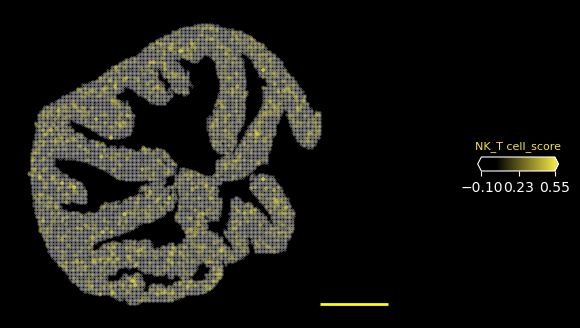

In [74]:
fig1

In [73]:
filelist  = ['SPF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_colon"]
NoneGenelist =[['Il22', 'Il17a']] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_colon
/data/work/08_plot/Figure1/Figure1E/SPF_colon
Project Exist!
single
0
genel:  ['Cd4', 'Trbc2', 'Il9r', 'Klrd1', 'Cd3e', 'Xcl1', 'Ctla4', 'Klrk1', 'Il17rb', 'Tcrg-C4', 'Trdc', 'Trbc1', 'Cd8a', 'Trac', 'Foxp3', 'Il13', 'Cd28', 'Ifng', 'Cd8b1', 'Ccl5', 'Ccl3', 'Il4', 'Ccl4', 'Tcrg-C2', 'Cd3d']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                NK_T cell_score
SPF:5260_23960        -0.006325
SPF:8240_19180         0.000000
SPF:8440_18900        -0.017045
SPF:5260_24080        -0.050446
SPF:7840_23780        -0.024921
...                         ...
SPF:7620_23360         0.000000
SPF:7000_23800         0.000000
SPF:8160_19200         0.000000
SPF:5600_22900         0.000000
SPF:6220_22600         0.000000

[33515 rows x 1 columns]
c:  0
min_color_intensity :  -0.1
max_color_intensity :  0.55


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_colon/SPF_colon_NK_T cell_gene.pdf
--- end ----


'Wed Jan 15 02:28:00 2025'

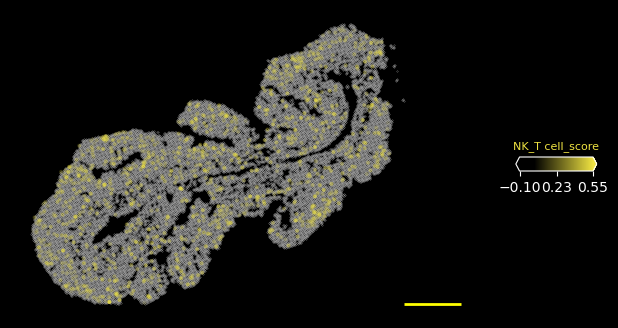

In [75]:
fig2

### Plasma score 

In [76]:
genelist = [['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']]
Allgene = ['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']
Celltypes = ['Plasma']
SpotSize = [1]
Colorlist = [[0]]
min_intensity = [-0.6]
max_intensity = [4.3]

In [77]:
filelist  = ['GF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_colon"]
NoneGenelist =[['Ighg2c']] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_colon
/data/work/08_plot/Figure1/Figure1E/GF_colon
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Plasma_score
GF:15880_11500      0.328524
GF:16680_12800      0.477840
GF:19260_11780      0.333753
GF:17740_10840     -0.280689
GF:19000_14220      0.287930
...                      ...
GF:18780_12240      0.000000
GF:16560_11980      0.000000
GF:17500_11580     -0.046052
GF:19440_14080     -0.046052
GF:18020_11280     -0.046052

[23254 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  4.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_colon/GF_colon_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:28:44 2025'

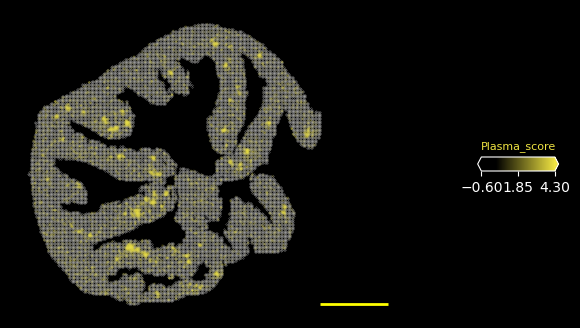

In [78]:
fig1

In [79]:
filelist  = ['SPF_colon.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_colon"]
NoneGenelist =[[]] 
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 1000,label = "500 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_colon
/data/work/08_plot/Figure1/Figure1E/SPF_colon
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Plasma_score
SPF:5260_23960     -0.129850
SPF:8240_19180     -0.097603
SPF:8440_18900      1.233129
SPF:5260_24080      1.566399
SPF:7840_23780      0.365842
...                      ...
SPF:7620_23360      0.000000
SPF:7000_23800      0.000000
SPF:8160_19200      0.000000
SPF:5600_22900      0.000000
SPF:6220_22600      0.000000

[33515 rows x 1 columns]
c:  0
min_color_intensity :  -0.6
max_color_intensity :  4.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_colon/SPF_colon_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:29:26 2025'

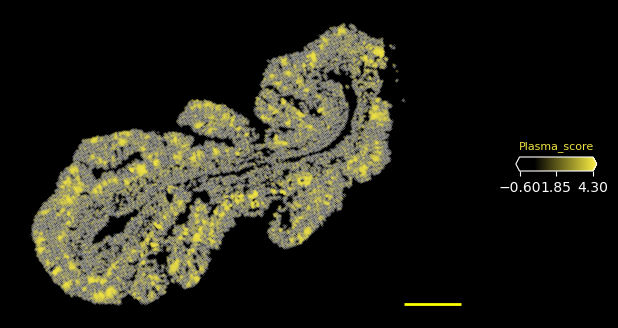

In [80]:
fig2

##  thymus 

### Plasma score 

In [103]:
genelist = [['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']]
Allgene = ['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']
Celltypes = ['Plasma']
SpotSize = [1] 
Colorlist = [[0]]
min_intensity = [-0.3]
max_intensity = [3.3] 

In [104]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Plasma_score
GF:10650_14150     -0.034817
GF:9950_14800      -0.025160
GF:11500_15450     -0.018065
GF:13150_13200     -0.041493
GF:12250_13250     -0.050547
...                      ...
GF:9000_13550       0.000000
GF:11000_10500      0.000000
GF:10200_10500      0.000000
GF:9300_15600       0.000000
GF:16000_15900      0.000000

[17351 rows x 1 columns]
c:  0
min_color_intensity :  -0.3
max_color_intensity :  3.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:53:35 2025'

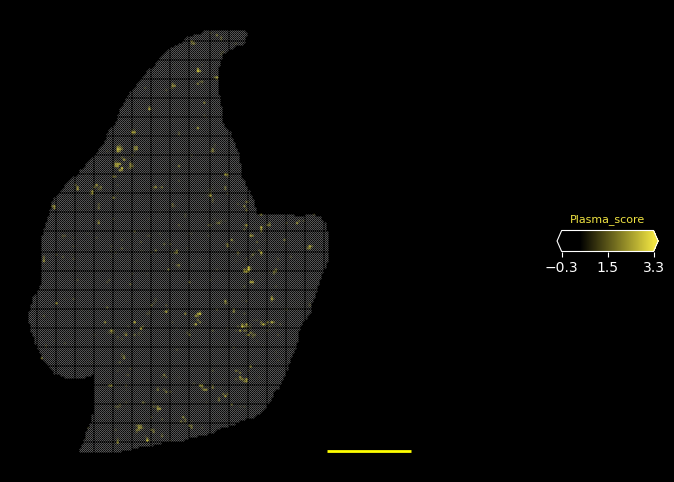

In [105]:
fig1

In [106]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                 Plasma_score
SPF:15200_13600      0.771685
SPF:14750_16750     -0.115643
SPF:18400_14100      0.227618
SPF:14950_7400       0.346705
SPF:7100_8350       -0.089270
...                       ...
SPF:17600_8700       0.000000
SPF:13600_12250      0.000000
SPF:17550_9150       0.000000
SPF:11750_18650      0.000000
SPF:11400_17100      0.000000

[44450 rows x 1 columns]
c:  0
min_color_intensity :  -0.3
max_color_intensity :  3.3


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_Plasma_gene.pdf
--- end ----


'Wed Jan 15 02:54:31 2025'

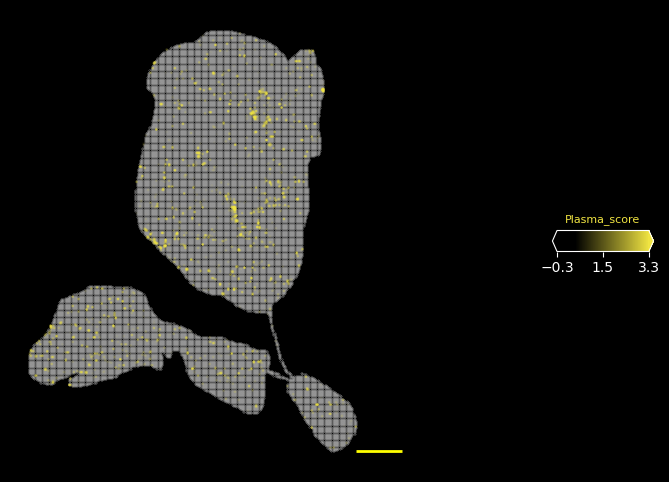

In [107]:
fig2

### DP-rich

In [108]:
genelist = ['Dntt','Rag2','Rag1']
Allgene = ['Dntt','Rag2','Rag1']
Celltypes = 'DP-rich'
Colorlist = [0,2,1] 
min_intensity = [0,0,0]
max_intensity = [6.8,5.2,6.7] # Rag1,Rag2,Dntt

In [112]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features            Rag1  Rag2      Dntt
GF:10650_14150  0.000000   0.0  0.000000
GF:9950_14800   0.000000   0.0  0.000000
GF:11500_15450  3.369035   0.0  3.369035
GF:13150_13200  0.000000   0.0  2.234337
GF:12250_13250  0.000000   0.0  0.000000
...                  ...   ...       ...
GF:9000_13550   0.000000   0.0  0.000000
GF:11000_10500  0.000000   0.0  0.000000
GF:10200_10500  0.000000   0.0  0.000000
GF:9300_15600   0.000000   0.0  0.000000
GF:16000_15900  0.000000   0.0  0.000000

[17351 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  6.8
c:  1
min_color_intensity :  0
max_color_intensity :  5.2
c:  2
min_color_intensity :  0
max_color_intensity :  6.7


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_DP-rich_gene.pdf
--- end ----


'Wed Jan 15 02:57:16 2025'

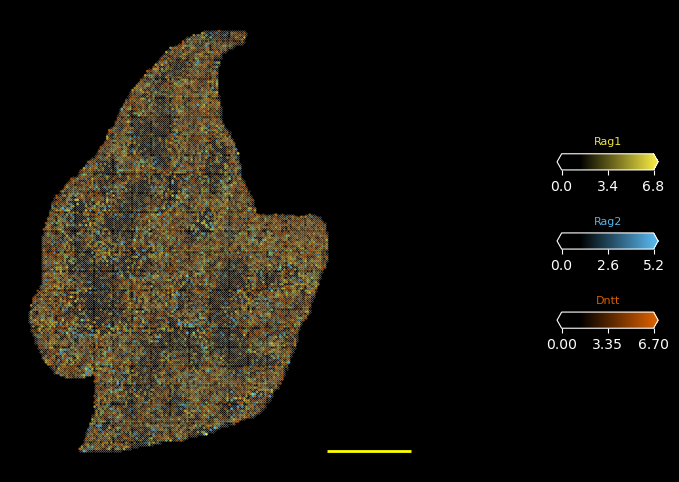

In [113]:
fig1 

In [114]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features             Rag1      Rag2      Dntt
SPF:15200_13600  1.988038  2.610246  0.000000
SPF:14750_16750  0.000000  0.000000  0.000000
SPF:18400_14100  3.344093  0.000000  0.000000
SPF:14950_7400   0.000000  0.000000  1.587717
SPF:7100_8350    3.396322  0.000000  1.633547
...                   ...       ...       ...
SPF:17600_8700   0.000000  0.000000  0.000000
SPF:13600_12250  0.000000  0.000000  0.000000
SPF:17550_9150   0.000000  0.000000  0.000000
SPF:11750_18650  0.000000  0.000000  0.000000
SPF:11400_17100  0.000000  0.000000  0.000000

[44450 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  6.8
c:  1
min_color_intensity :  0
max_color_intensity :  5.2
c:  2
min_color_intensity :  0
max_color_intensity :  6.7


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_DP-rich_gene.pdf
--- end ----


'Wed Jan 15 02:59:32 2025'

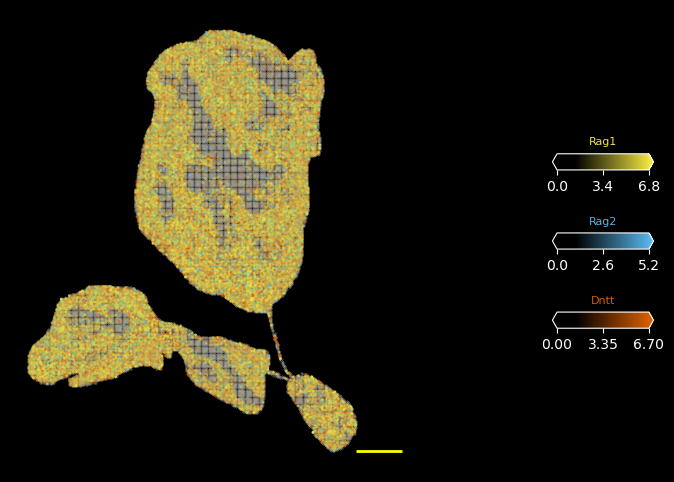

In [115]:
fig2 

### SP2-enrich

In [116]:
genelist = ['Nr4a1','Cd69']
Allgene = ['Nr4a1','Cd69']
Celltypes = 'SP2-enrich'
Colorlist = [0,0] 
min_intensity = [0,0]
max_intensity = [5,4.9]  # 'Cd69','Nr4a1'

In [124]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 =MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features        Cd69  Nr4a1
GF:10650_14150   0.0    0.0
GF:9950_14800    0.0    0.0
GF:11500_15450   0.0    0.0
GF:13150_13200   0.0    0.0
GF:12250_13250   0.0    0.0
...              ...    ...
GF:9000_13550    0.0    0.0
GF:11000_10500   0.0    0.0
GF:10200_10500   0.0    0.0
GF:9300_15600    0.0    0.0
GF:16000_15900   0.0    0.0

[17351 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5
c:  1
min_color_intensity :  0
max_color_intensity :  4.9


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_SP2-enrich_gene.pdf
--- end ----


'Wed Jan 15 03:10:07 2025'

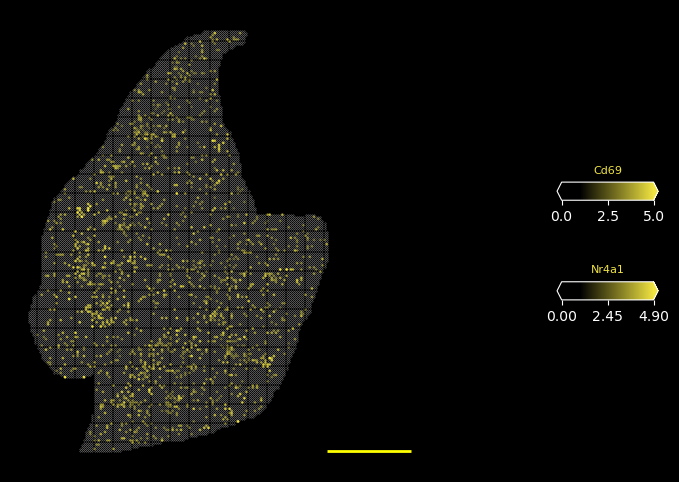

In [125]:
fig1

In [126]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features         Cd69     Nr4a1
SPF:15200_13600   0.0  0.000000
SPF:14750_16750   0.0  1.524868
SPF:18400_14100   0.0  0.000000
SPF:14950_7400    0.0  0.000000
SPF:7100_8350     0.0  0.000000
...               ...       ...
SPF:17600_8700    0.0  0.000000
SPF:13600_12250   0.0  0.000000
SPF:17550_9150    0.0  0.000000
SPF:11750_18650   0.0  0.000000
SPF:11400_17100   0.0  0.000000

[44450 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5
c:  1
min_color_intensity :  0
max_color_intensity :  4.9


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_SP2-enrich_gene.pdf
--- end ----


'Wed Jan 15 03:11:04 2025'

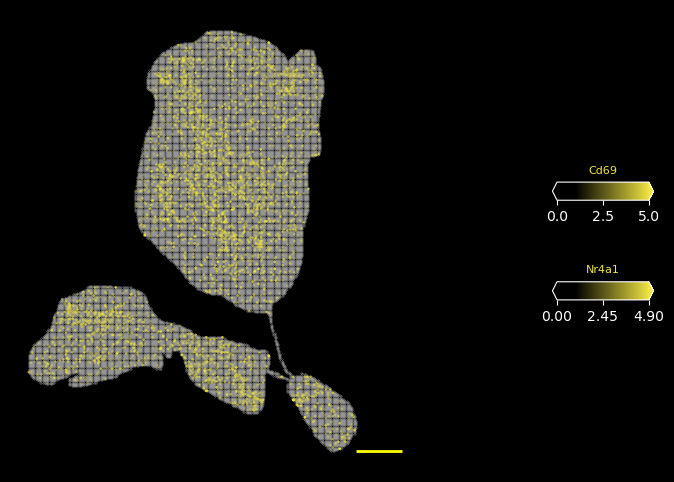

In [127]:
fig2

### Mature_T_rich

In [128]:
genelist = ['Il7r','S1pr1']
Allgene = ['Il7r','S1pr1']
Celltypes = 'Mature_T_rich'
Colorlist = [0,0] 
min_intensity = [0,0]
max_intensity = [4.4,4.6] # S1pr1,Il7r

In [131]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 =MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features        S1pr1  Il7r
GF:10650_14150    0.0   0.0
GF:9950_14800     0.0   0.0
GF:11500_15450    0.0   0.0
GF:13150_13200    0.0   0.0
GF:12250_13250    0.0   0.0
...               ...   ...
GF:9000_13550     0.0   0.0
GF:11000_10500    0.0   0.0
GF:10200_10500    0.0   0.0
GF:9300_15600     0.0   0.0
GF:16000_15900    0.0   0.0

[17351 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.6


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_Mature_T_rich_gene.pdf
--- end ----


'Wed Jan 15 03:16:42 2025'

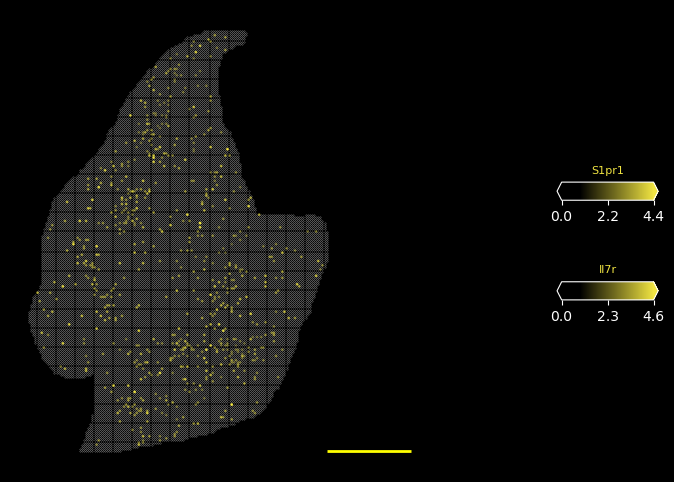

In [132]:
fig1 

In [133]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features         S1pr1  Il7r
SPF:15200_13600    0.0   0.0
SPF:14750_16750    0.0   0.0
SPF:18400_14100    0.0   0.0
SPF:14950_7400     0.0   0.0
SPF:7100_8350      0.0   0.0
...                ...   ...
SPF:17600_8700     0.0   0.0
SPF:13600_12250    0.0   0.0
SPF:17550_9150     0.0   0.0
SPF:11750_18650    0.0   0.0
SPF:11400_17100    0.0   0.0

[44450 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.6


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_Mature_T_rich_gene.pdf
--- end ----


'Wed Jan 15 03:17:35 2025'

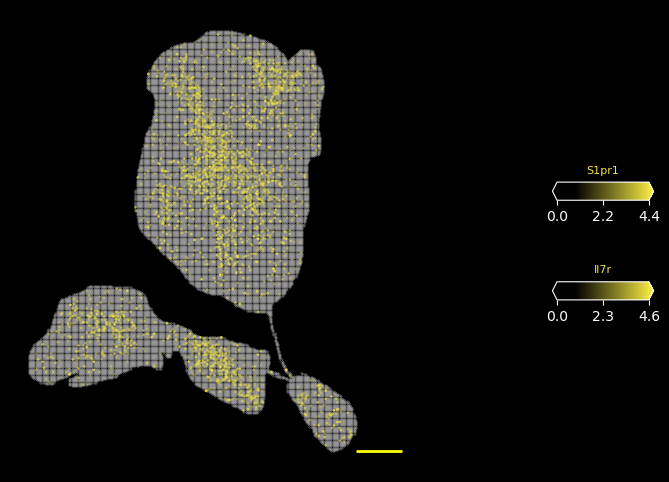

In [134]:
fig2

### Treg_rich

In [138]:
genelist = ['Foxp3','Tnfrsf4','Ctla4']
Allgene = ['Foxp3','Tnfrsf4','Ctla4']
Celltypes = 'Treg_rich'
Colorlist = [2,1,1] # Ctla4  Tnfrsf4  Foxp3 2 1 1 
min_intensity = [0,0,0]
max_intensity = [4.4,4.9,3.8]  

In [139]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 =MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features        Ctla4   Tnfrsf4  Foxp3
GF:10650_14150    0.0  3.101507    0.0
GF:9950_14800     0.0  0.000000    0.0
GF:11500_15450    0.0  0.000000    0.0
GF:13150_13200    0.0  0.000000    0.0
GF:12250_13250    0.0  0.000000    0.0
...               ...       ...    ...
GF:9000_13550     0.0  0.000000    0.0
GF:11000_10500    0.0  0.000000    0.0
GF:10200_10500    0.0  0.000000    0.0
GF:9300_15600     0.0  0.000000    0.0
GF:16000_15900    0.0  0.000000    0.0

[17351 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.9
c:  2
min_color_intensity :  0
max_color_intensity :  3.8


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_Treg_rich_gene.pdf
--- end ----


'Wed Jan 15 03:23:13 2025'

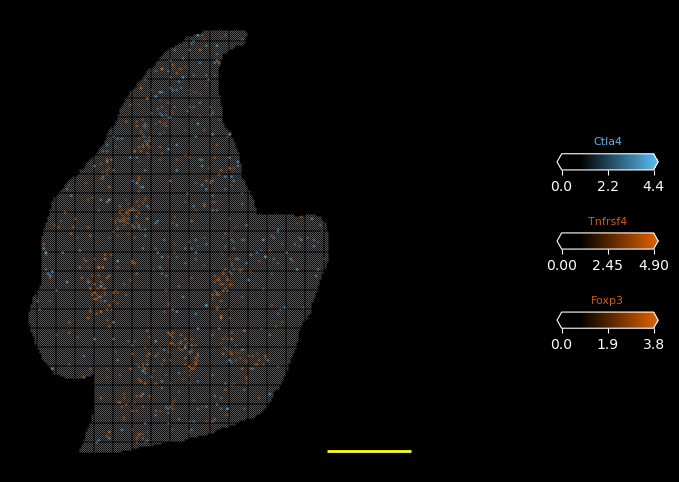

In [140]:
fig1

In [141]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features            Ctla4  Tnfrsf4  Foxp3
SPF:15200_13600  0.000000      0.0    0.0
SPF:14750_16750  0.000000      0.0    0.0
SPF:18400_14100  0.000000      0.0    0.0
SPF:14950_7400   1.587717      0.0    0.0
SPF:7100_8350    0.000000      0.0    0.0
...                   ...      ...    ...
SPF:17600_8700   0.000000      0.0    0.0
SPF:13600_12250  0.000000      0.0    0.0
SPF:17550_9150   0.000000      0.0    0.0
SPF:11750_18650  0.000000      0.0    0.0
SPF:11400_17100  0.000000      0.0    0.0

[44450 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.9
c:  2
min_color_intensity :  0
max_color_intensity :  3.8


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_Treg_rich_gene.pdf
--- end ----


'Wed Jan 15 03:24:14 2025'

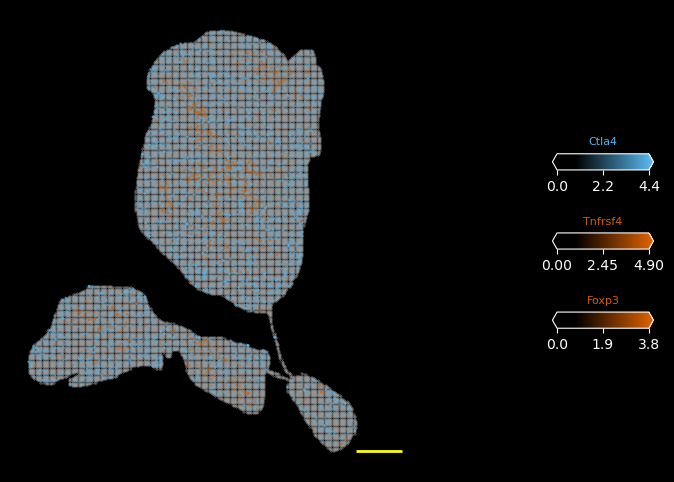

In [142]:
fig2 

### Macro-rich 

In [143]:
genelist = ['C1qb','C1qa']
Allgene = ['C1qb','C1qa']
Celltypes = 'Macro-rich'
Colorlist = [0,0]  
min_intensity = [0,0]
max_intensity = [5,5.1] # C1qb，C1qa

In [146]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features        C1qb  C1qa
GF:10650_14150   0.0   0.0
GF:9950_14800    0.0   0.0
GF:11500_15450   0.0   0.0
GF:13150_13200   0.0   0.0
GF:12250_13250   0.0   0.0
...              ...   ...
GF:9000_13550    0.0   0.0
GF:11000_10500   0.0   0.0
GF:10200_10500   0.0   0.0
GF:9300_15600    0.0   0.0
GF:16000_15900   0.0   0.0

[17351 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5
c:  1
min_color_intensity :  0
max_color_intensity :  5.1


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_Macro-rich_gene.pdf
--- end ----


'Wed Jan 15 03:27:26 2025'

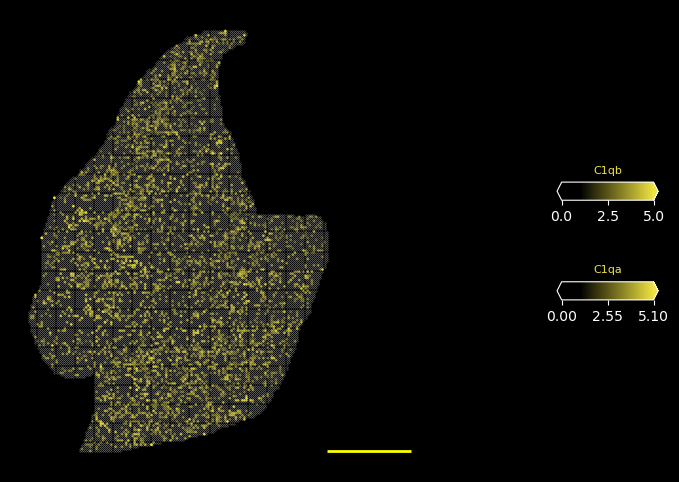

In [147]:
fig1

In [148]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features         C1qb      C1qa
SPF:15200_13600   0.0  2.610246
SPF:14750_16750   0.0  0.000000
SPF:18400_14100   0.0  0.000000
SPF:14950_7400    0.0  0.000000
SPF:7100_8350     0.0  0.000000
...               ...       ...
SPF:17600_8700    0.0  0.000000
SPF:13600_12250   0.0  0.000000
SPF:17550_9150    0.0  0.000000
SPF:11750_18650   0.0  0.000000
SPF:11400_17100   0.0  0.000000

[44450 rows x 2 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5
c:  1
min_color_intensity :  0
max_color_intensity :  5.1


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_Macro-rich_gene.pdf
--- end ----


'Wed Jan 15 03:28:23 2025'

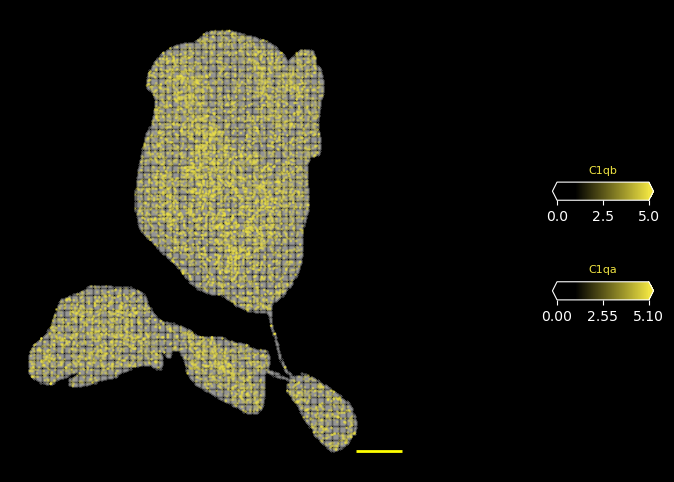

In [149]:
fig2

### Vascular-microenvironment 

In [155]:
genelist = ['Vwf','Myh11','Acta2','Tagln']
Allgene = ['Vwf','Myh11','Acta2','Tagln']
Celltypes = 'Vascular-microenvironment'
Colorlist = [1,1,2,1] # 
min_intensity = [0,0,0,0]
max_intensity = [4.9,4,4.2,4] # Acta2,Tagln,Vwf,Myh11

In [156]:
filelist  = ['GF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig1 =MutilGeneExperssion(Dict,  min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_thymus
/data/work/08_plot/Figure1/Figure1E/GF_thymus
Project Exist!
multiple
features        Acta2  Myh11  Vwf  Tagln
GF:10650_14150    0.0    0.0  0.0    0.0
GF:9950_14800     0.0    0.0  0.0    0.0
GF:11500_15450    0.0    0.0  0.0    0.0
GF:13150_13200    0.0    0.0  0.0    0.0
GF:12250_13250    0.0    0.0  0.0    0.0
...               ...    ...  ...    ...
GF:9000_13550     0.0    0.0  0.0    0.0
GF:11000_10500    0.0    0.0  0.0    0.0
GF:10200_10500    0.0    0.0  0.0    0.0
GF:9300_15600     0.0    0.0  0.0    0.0
GF:16000_15900    0.0    0.0  0.0    0.0

[17351 rows x 4 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.9
c:  1
min_color_intensity :  0
max_color_intensity :  4
c:  2
min_color_intensity :  0
max_color_intensity :  4.2
c:  3
min_color_intensity :  0
max_color_intensity :  4


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_thymus/GF_thymus_Vascular-microenvironment_gene.pdf
--- end ----


'Wed Jan 15 03:32:24 2025'

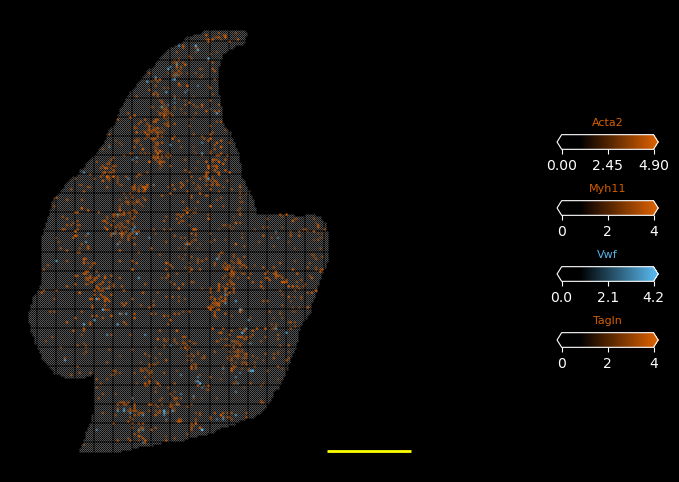

In [157]:
fig1

In [158]:
filelist  = ['SPF_thymus.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_thymus"]
NoneGenelist =[[]]  
SpotSize = 1 # 0.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Figsize = (10,6),
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_thymus
/data/work/08_plot/Figure1/Figure1E/SPF_thymus
Project Exist!
multiple
features         Acta2  Myh11  Vwf  Tagln
SPF:15200_13600    0.0    0.0  0.0    0.0
SPF:14750_16750    0.0    0.0  0.0    0.0
SPF:18400_14100    0.0    0.0  0.0    0.0
SPF:14950_7400     0.0    0.0  0.0    0.0
SPF:7100_8350      0.0    0.0  0.0    0.0
...                ...    ...  ...    ...
SPF:17600_8700     0.0    0.0  0.0    0.0
SPF:13600_12250    0.0    0.0  0.0    0.0
SPF:17550_9150     0.0    0.0  0.0    0.0
SPF:11750_18650    0.0    0.0  0.0    0.0
SPF:11400_17100    0.0    0.0  0.0    0.0

[44450 rows x 4 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.9
c:  1
min_color_intensity :  0
max_color_intensity :  4
c:  2
min_color_intensity :  0
max_color_intensity :  4.2
c:  3
min_color_intensity :  0
max_color_intensity :  4


/tmp/ipykernel_793/3523572221.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_thymus/SPF_thymus_Vascular-microenvironment_gene.pdf
--- end ----


'Wed Jan 15 03:33:21 2025'

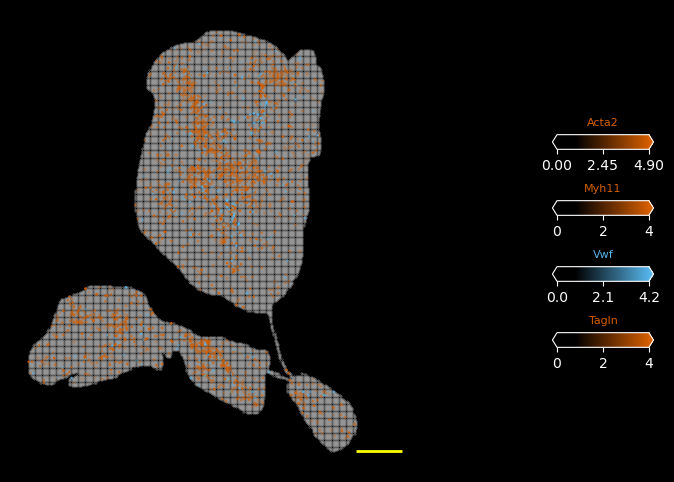

In [159]:
fig2

## spleen 

### Plasma score 

In [164]:
genelist = [['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']]
Allgene = ['Jchain','Ighg3','Ighg2b','Ighg2c','Ighg1','Igha']
Celltypes = ['Plasma']
SpotSize = [1.5]
Colorlist = [[0]]
min_intensity = [-0.4]
max_intensity = [3]

In [166]:
filelist  = ['GF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_spleen"]
NoneGenelist =[[]] 

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)
fig1 = MutilGeneExperssion(Dict, min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  GF_spleen
/data/work/08_plot/Figure1/Figure1E/GF_spleen
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']
                Plasma_score
GF:14550_11350     -0.015739
GF:12300_10300     -0.007413
GF:10050_11100     -0.045748
GF:14150_10950     -0.027738
GF:15250_10650     -0.035660
...                      ...
GF:15900_12350     -0.019137
GF:13100_10550     -0.015209
GF:9450_9900       -0.012870
GF:13500_11200     -0.036979
GF:15450_12450     -0.036444

[7446 rows x 1 columns]


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


c:  0
min_color_intensity :  -0.4
max_color_intensity :  3


/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_spleen/GF_spleen_Plasma_gene.pdf
--- end ----


'Wed Jan 15 03:41:14 2025'

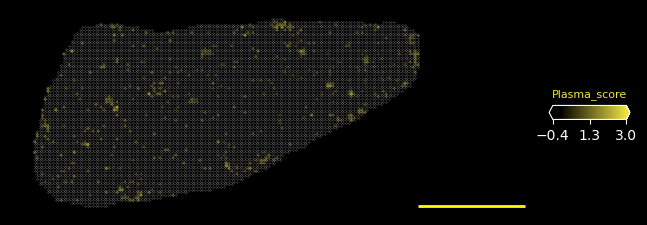

In [167]:
fig1 

In [168]:
filelist  = ['SPF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_spleen"]
NoneGenelist =[[]] 

Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)

fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "single")
datetime.datetime.now().strftime('%c')

sample:  SPF_spleen
/data/work/08_plot/Figure1/Figure1E/SPF_spleen
Project Exist!
single
0
genel:  ['Ighg2b', 'Ighg1', 'Igha', 'Jchain', 'Ighg3', 'Ighg2c']


/opt/conda/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


                Plasma_score
SPF:8700_13550     -0.153508
SPF:7050_14150      0.334638
SPF:9200_14350      1.063033
SPF:8650_14000      0.206388
SPF:11750_9050     -0.072321
...                      ...
SPF:6950_12450      0.000000
SPF:6800_12500     -0.021901
SPF:6950_12550      1.135591
SPF:7000_12500      0.000000
SPF:6850_12500      0.000000

[11957 rows x 1 columns]
c:  0
min_color_intensity :  -0.4
max_color_intensity :  3


/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_spleen/SPF_spleen_Plasma_gene.pdf
--- end ----


'Wed Jan 15 03:41:35 2025'

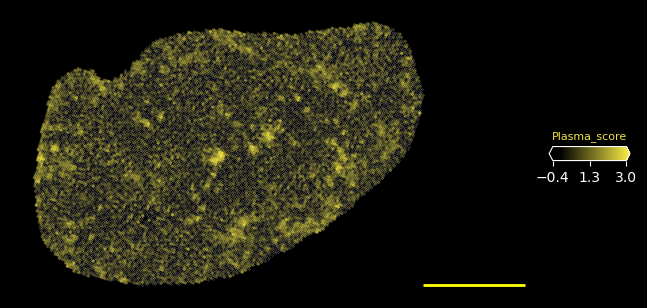

In [169]:
fig2

### Red_white_pulp

In [175]:
genelist = ['Cd74','Marco','Hbb-bt']
Allgene = ['Cd74','Marco','Hbb-bt']
Celltypes = 'Red_white_pulp'
Colorlist = [2,1,0] # 
min_intensity = [0,0,0]
max_intensity = [5.4,4.3,4.4] # Hbb-bt Cd74 Marco

In [176]:
filelist  = ['GF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_spleen"]
NoneGenelist =[[]] 

SpotSize = 1.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)
fig1 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_spleen
/data/work/08_plot/Figure1/Figure1E/GF_spleen
Project Exist!
multiple
features        Hbb-bt      Cd74     Marco
GF:14550_11350     0.0  0.000000  0.000000
GF:12300_10300     0.0  0.000000  0.000000
GF:10050_11100     0.0  1.735700  0.000000
GF:14150_10950     0.0  0.000000  0.000000
GF:15250_10650     0.0  2.139625  0.000000
...                ...       ...       ...
GF:15900_12350     0.0  0.000000  0.000000
GF:13100_10550     0.0  0.000000  2.591764
GF:9450_9900       0.0  0.000000  3.860974
GF:13500_11200     0.0  0.000000  0.000000
GF:15450_12450     0.0  0.000000  0.000000

[7446 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.3
c:  2
min_color_intensity :  0
max_color_intensity :  4.4


/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_spleen/GF_spleen_Red_white_pulp_gene.pdf
--- end ----


'Wed Jan 15 03:47:17 2025'

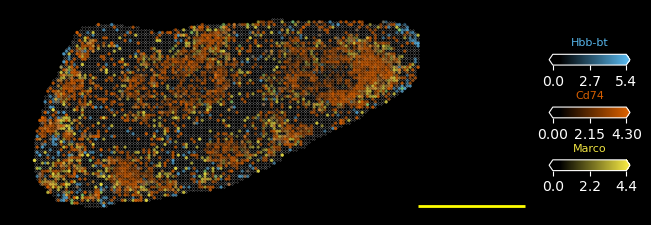

In [177]:
fig1 

In [178]:
filelist  = ['SPF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_spleen"]
NoneGenelist =[[]] 

SpotSize = 1.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)
fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_spleen
/data/work/08_plot/Figure1/Figure1E/SPF_spleen
Project Exist!
multiple
features          Hbb-bt      Cd74     Marco
SPF:8700_13550  0.000000  0.000000  1.737627
SPF:7050_14150  3.077494  0.000000  0.000000
SPF:9200_14350  4.452911  0.000000  1.580632
SPF:8650_14000  0.000000  2.639336  0.000000
SPF:11750_9050  0.000000  0.000000  0.000000
...                  ...       ...       ...
SPF:6950_12450  0.000000  0.000000  0.000000
SPF:6800_12500  0.000000  0.000000  0.000000
SPF:6950_12550  0.000000  0.000000  0.000000
SPF:7000_12500  0.000000  0.000000  0.000000
SPF:6850_12500  0.000000  0.000000  0.000000

[11957 rows x 3 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  5.4
c:  1
min_color_intensity :  0
max_color_intensity :  4.3
c:  2
min_color_intensity :  0
max_color_intensity :  4.4


/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_spleen/SPF_spleen_Red_white_pulp_gene.pdf
--- end ----


'Wed Jan 15 03:47:44 2025'

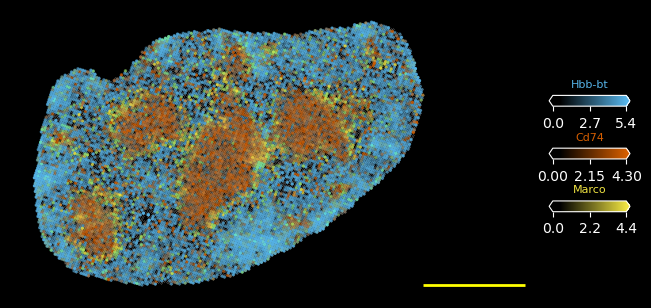

In [179]:
fig2

### white_pulp

In [183]:
genelist = ['Cr2','Cd3d','Ighd','Marco','Cd3e']
Allgene = ['Cr2','Cd3d','Ighd','Marco','Cd3e']
Celltypes = 'white_pulp'
Colorlist = [1,0,2,7,7]  
min_intensity = [0,0,0,0,0]
max_intensity = [4.5,4.4,4.2,4,4] # Cr2    Marco   Ighd  Cd3e  Cd3d 

In [184]:
filelist  = ['GF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["GF_spleen"]
NoneGenelist =[[]] 

SpotSize = 1.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)
fig1 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  GF_spleen
/data/work/08_plot/Figure1/Figure1E/GF_spleen
Project Exist!
multiple
features            Cr2     Marco      Ighd  Cd3e  Cd3d
GF:14550_11350  0.00000  0.000000  0.000000   0.0   0.0
GF:12300_10300  0.00000  0.000000  2.223977   0.0   0.0
GF:10050_11100  0.00000  0.000000  1.735700   0.0   0.0
GF:14150_10950  1.92595  0.000000  0.000000   0.0   0.0
GF:15250_10650  0.00000  0.000000  0.000000   0.0   0.0
...                 ...       ...       ...   ...   ...
GF:15900_12350  0.00000  0.000000  0.000000   0.0   0.0
GF:13100_10550  0.00000  2.591764  0.000000   0.0   0.0
GF:9450_9900    0.00000  3.860974  0.000000   0.0   0.0
GF:13500_11200  0.00000  0.000000  0.000000   0.0   0.0
GF:15450_12450  0.00000  0.000000  0.000000   0.0   0.0

[7446 rows x 5 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.5
c:  1
min_color_intensity :  0
max_color_intensity :  4.4
c:  2
min_color_intensity :  0
max_color_intensity :  4.2
c:  3
min_color_intensity :  0
max_color

/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/GF_spleen/GF_spleen_white_pulp_gene.pdf
--- end ----


'Wed Jan 15 03:52:23 2025'

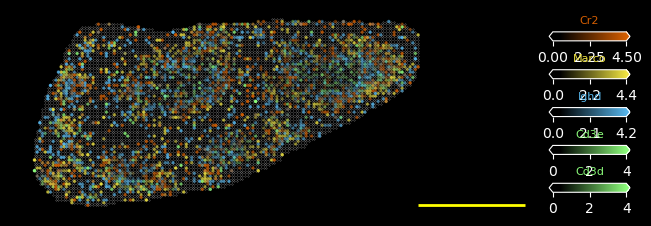

In [185]:
fig1

In [186]:
filelist  = ['SPF_spleen.h5ad']
output = "/data/work/08_plot/Figure1/Figure1E"
samplelist = ["SPF_spleen"]
NoneGenelist =[[]] 

SpotSize = 1.5
Dict = CreateParaDict(Filelist = filelist, Samplelist = samplelist,
                      NoneGenelist = NoneGenelist,Genelist = genelist, 
                      AllGene = Allgene,Celltypes = Celltypes,
                      SpotSize = SpotSize,Colorlist = Colorlist,
                      Output=output)
fig2 = MutilGeneExperssion(Dict,min_intensity = min_intensity ,max_intensity = max_intensity,
                    Style = 'dark_background',ColorBarSize = 8,ColorbarTickSize = 10,size = 80,
                    ruler_length = 2000,label = "1000 μm",lw = 2,y_local  = 200,x_shift = 0,
                    method = "multiple")
datetime.datetime.now().strftime('%c')

sample:  SPF_spleen
/data/work/08_plot/Figure1/Figure1E/SPF_spleen
Project Exist!
multiple
features             Cr2     Marco      Ighd  Cd3e  Cd3d
SPF:8700_13550  0.000000  1.737627  1.737627   0.0   0.0
SPF:7050_14150  0.000000  0.000000  2.067029   0.0   0.0
SPF:9200_14350  2.531637  1.580632  0.000000   0.0   0.0
SPF:8650_14000  0.000000  0.000000  0.000000   0.0   0.0
SPF:11750_9050  2.387955  0.000000  0.000000   0.0   0.0
...                  ...       ...       ...   ...   ...
SPF:6950_12450  0.000000  0.000000  0.000000   0.0   0.0
SPF:6800_12500  0.000000  0.000000  0.000000   0.0   0.0
SPF:6950_12550  0.000000  0.000000  0.000000   0.0   0.0
SPF:7000_12500  0.000000  0.000000  0.000000   0.0   0.0
SPF:6850_12500  0.000000  0.000000  0.000000   0.0   0.0

[11957 rows x 5 columns]
c:  0
min_color_intensity :  0
max_color_intensity :  4.5
c:  1
min_color_intensity :  0
max_color_intensity :  4.4
c:  2
min_color_intensity :  0
max_color_intensity :  4.2
c:  3
min_color_intensity

/tmp/ipykernel_793/116774287.py:383: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


/data/work/08_plot/Figure1/Figure1E/SPF_spleen/SPF_spleen_white_pulp_gene.pdf
--- end ----


'Wed Jan 15 03:53:43 2025'

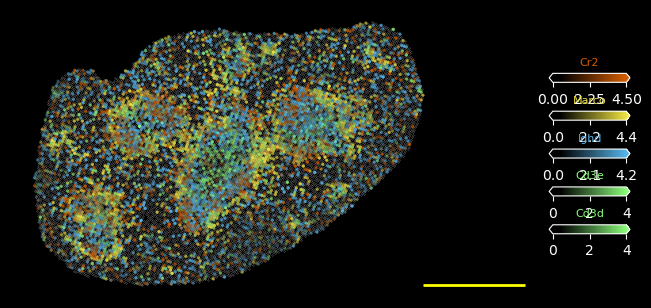

In [187]:
fig2

## liver 

In [2]:
import os
import squidpy as sq
import pandas as pd
import scanpy as sc
import numpy as np

import alphashape
import matplotlib as mpl
import matplotlib.pyplot as plt
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString

In [24]:
plt.style.use("dark_background")

In [4]:
colors = ["darkgrey", "yellow"]
cmap = LinearSegmentedColormap.from_list("CustomCmap", colors)

In [5]:
from matplotlib.colors import ListedColormap
from matplotlib.gridspec import GridSpec

def get_rgb_function(cmap, min_value, max_value):
    r"""Generate a function to map continous values to RGB values using colormap between min_value & max_value."""

    if min_value > max_value:
        raise ValueError("Max_value should be greater or than min_value.")

    if min_value == max_value:
        warnings.warn(
            "Max_color is equal to min_color. It might be because of the data or bad parameter choice. "
            "If you are using plot_contours function try increasing max_color_quantile parameter and"
            "removing cell types with all zero values."
        )

        def func_equal(x):
            factor = 0 if max_value == 0 else 0.5
            return cmap(np.ones_like(x) * factor)

        return func_equal

    def func(x):
        return cmap((np.clip(x, min_value, max_value) - min_value) / (max_value - min_value))

    return func


def rgb_to_ryb(rgb):
    """
    Converts colours from RGB colorspace to RYB

    Parameters
    ----------

    rgb
        numpy array Nx3

    Returns
    -------
    Numpy array Nx3
    """
    rgb = np.array(rgb)
    if len(rgb.shape) == 1:
        rgb = rgb[np.newaxis, :]

    white = rgb.min(axis=1)
    black = (1 - rgb).min(axis=1)
    rgb = rgb - white[:, np.newaxis]

    yellow = rgb[:, :2].min(axis=1)
    ryb = np.zeros_like(rgb)
    ryb[:, 0] = rgb[:, 0] - yellow
    ryb[:, 1] = (yellow + rgb[:, 1]) / 2
    ryb[:, 2] = (rgb[:, 2] + rgb[:, 1] - yellow) / 2

    mask = ~(ryb == 0).all(axis=1)
    if mask.any():
        norm = ryb[mask].max(axis=1) / rgb[mask].max(axis=1)
        ryb[mask] = ryb[mask] / norm[:, np.newaxis]

    return ryb + black[:, np.newaxis]


def ryb_to_rgb(ryb):
    """
    Converts colours from RYB colorspace to RGB

    Parameters
    ----------

    ryb
        numpy array Nx3

    Returns
    -------
    Numpy array Nx3
    """
    ryb = np.array(ryb)
    if len(ryb.shape) == 1:
        ryb = ryb[np.newaxis, :]

    black = ryb.min(axis=1)
    white = (1 - ryb).min(axis=1)
    ryb = ryb - black[:, np.newaxis]

    green = ryb[:, 1:].min(axis=1)
    rgb = np.zeros_like(ryb)
    rgb[:, 0] = ryb[:, 0] + ryb[:, 1] - green
    rgb[:, 1] = green + ryb[:, 1]
    rgb[:, 2] = (ryb[:, 2] - green) * 2

    mask = ~(ryb == 0).all(axis=1)
    if mask.any():
        norm = rgb[mask].max(axis=1) / ryb[mask].max(axis=1)
        rgb[mask] = rgb[mask] / norm[:, np.newaxis]

    return rgb + white[:, np.newaxis]


def plot_spatial_general(
    value_df,
    coords,
    labels,
    text=None,
    circle_diameter=4.0,
    alpha_scaling=1.0,
    max_col=(np.inf, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
    max_color_quantile=0.98,
    show_img=True,
    img=None,
    img_alpha=1.0,
    adjust_text=False,
    plt_axis="off",
    axis_y_flipped=True,
    x_y_labels=("", ""),
    crop_x=None,
    crop_y=None,
    text_box_alpha=0.9,
    reorder_cmap=range(7),
    style="fast",
    colorbar_position="bottom",
    colorbar_label_kw={},
    colorbar_shape={},
    colorbar_tick_size=12,
    colorbar_grid=None,
    image_cmap="Greys_r",
    white_spacing=40,
    max_value=None
):
    r"""Plot spatial abundance of cell types (regulatory programmes) with colour gradient and interpolation.

      This method supports only 7 cell types with these colours (in order, which can be changed using reorder_cmap).
      'yellow' 'orange' 'blue' 'green' 'purple' 'grey' 'white'

    :param value_df: pd.DataFrame - with cell abundance or other features (only 7 allowed, columns) across locations (rows)
    :param coords: np.ndarray - x and y coordinates (in columns) to be used for ploting spots
    :param text: pd.DataFrame - with x, y coordinates, text to be printed
    :param circle_diameter: diameter of circles
    :param labels: list of strings, labels of cell types
    :param alpha_scaling: adjust color alpha
    :param max_col: crops the colorscale maximum value for each column in value_df.
    :param max_color_quantile: crops the colorscale at x quantile of the data.
    :param show_img: show image?
    :param img: numpy array representing a tissue image.
        If not provided a black background image is used.
    :param img_alpha: transparency of the image
    :param lim: x and y max limits on the plot. Minimum is always set to 0, if `lim` is None maximum
        is set to image height and width. If 'no_limit' then no limit is set.
    :param adjust_text: move text label to prevent overlap
    :param plt_axis: show axes?
    :param axis_y_flipped: flip y axis to match coordinates of the plotted image
    :param reorder_cmap: reorder colors to make sure you get the right color for each category

    :param style: plot style (matplolib.style.context):
        'fast' - white background & dark text;
        'dark_background' - black background & white text;

    :param colorbar_position: 'bottom', 'right' or None
    :param colorbar_label_kw: dict that will be forwarded to ax.set_label()
    :param colorbar_shape: dict {'vertical_gaps': 1.5, 'horizontal_gaps': 1.5,
                                    'width': 0.2, 'height': 0.2}, not obligatory to contain all params
    :param colorbar_tick_size: colorbar ticks label size
    :param colorbar_grid: tuple of colorbar grid (rows, columns)
    :param image_cmap: matplotlib colormap for grayscale image
    :param white_spacing: percent of colorbars to be hidden

    """

    if value_df.shape[1] > 7:
        raise ValueError("Maximum of 7 cell types / factors can be plotted at the moment")

    def create_colormap(R, G, B):
        spacing = int(white_spacing * 2.55)

        N = 255
        M = 3

        alphas = np.concatenate([[0] * spacing * M, np.linspace(0, 1.0, (N - spacing) * M)])

        vals = np.ones((N * M, 4))
        #         vals[:, 0] = np.linspace(1, R / 255, N * M)
        #         vals[:, 1] = np.linspace(1, G / 255, N * M)
        #         vals[:, 2] = np.linspace(1, B / 255, N * M)
        for i, color in enumerate([R, G, B]):
            vals[:, i] = color / 255
        vals[:, 3] = alphas

        return ListedColormap(vals)

    # Create linearly scaled colormaps
    YellowCM = create_colormap(240, 228, 66)  # #F0E442 ['#F0E442', '#D55E00', '#56B4E9',
    # '#009E73', '#5A14A5', '#C8C8C8', '#323232']
    RedCM = create_colormap(213, 94, 0)  # #D55E00
    BlueCM = create_colormap(86, 180, 233)  # #56B4E9
    GreenCM = create_colormap(0, 158, 115)  # #009E73
    GreyCM = create_colormap(200, 200, 200)  # #C8C8C8
    WhiteCM = create_colormap(50, 50, 50)  # #323232
    PurpleCM = create_colormap(90, 20, 165)  # #5A14A5

    cmaps = [YellowCM, RedCM, BlueCM, GreenCM, PurpleCM, GreyCM, WhiteCM]

    cmaps = [cmaps[i] for i in reorder_cmap]

    with mpl.style.context(style):

        fig = plt.figure()

        if colorbar_position == "right":

            if colorbar_grid is None:
                colorbar_grid = (len(labels), 1)

            shape = {"vertical_gaps": 1.5, "horizontal_gaps": 0, "width": 0.15, "height": 0.2}
            shape = {**shape, **colorbar_shape}

            gs = GridSpec(
                nrows=colorbar_grid[0] + 2,
                ncols=colorbar_grid[1] + 1,
                width_ratios=[1, *[shape["width"]] * colorbar_grid[1]],
                height_ratios=[1, *[shape["height"]] * colorbar_grid[0], 1],
                hspace=shape["vertical_gaps"],
                wspace=shape["horizontal_gaps"],
            )
            ax = fig.add_subplot(gs[:, 0], aspect="equal", rasterized=False)

        if colorbar_position == "bottom":
            if colorbar_grid is None:
                if len(labels) <= 3:
                    colorbar_grid = (1, len(labels))
                else:
                    n_rows = round(len(labels) / 3 + 0.5 - 1e-9)
                    colorbar_grid = (n_rows, 3)

            shape = {"vertical_gaps": 0.3, "horizontal_gaps": 0.6, "width": 0.2, "height": 0.035}
            shape = {**shape, **colorbar_shape}

            gs = GridSpec(
                nrows=colorbar_grid[0] + 1,
                ncols=colorbar_grid[1] + 2,
                width_ratios=[0.3, *[shape["width"]] * colorbar_grid[1], 0.3],
                height_ratios=[1, *[shape["height"]] * colorbar_grid[0]],
                hspace=shape["vertical_gaps"],
                wspace=shape["horizontal_gaps"],
            )

            ax = fig.add_subplot(gs[0, :], aspect="equal", rasterized=False)

        if colorbar_position is None:
            ax = fig.add_subplot(aspect="equal", rasterized=False)

        if colorbar_position is not None:
            cbar_axes = []
            for row in range(1, colorbar_grid[0] + 1):
                for column in range(1, colorbar_grid[1] + 1):
                    cbar_axes.append(fig.add_subplot(gs[row, column]))

            n_excess = colorbar_grid[0] * colorbar_grid[1] - len(labels)
            if n_excess > 0:
                for i in range(1, n_excess + 1):
                    cbar_axes[-i].set_visible(False)

        ax.set_xlabel(x_y_labels[0])
        ax.set_ylabel(x_y_labels[1])

        if img is not None and show_img:
            ax.imshow(img, aspect="equal", alpha=img_alpha, origin="lower", cmap=image_cmap)

        # crop images in needed
        if crop_x is not None:
            ax.set_xlim(crop_x[0], crop_x[1])
        if crop_y is not None:
            ax.set_ylim(crop_y[0], crop_y[1])

        if axis_y_flipped:
            ax.invert_yaxis()

        if plt_axis == "off":
            for spine in ax.spines.values():
                spine.set_visible(False)
            ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)

        counts = value_df.values.copy()

        # plot spots as circles
        c_ord = list(np.arange(0, counts.shape[1]))

        colors = np.zeros((*counts.shape, 4))
        weights = np.zeros(counts.shape)

        for c in c_ord:

            min_color_intensity = counts[:, c].min()
            #max_color_intensity = np.min([np.quantile(counts[:, c], max_color_quantile), max_col[c]])
            max_color_intensity = max_col[c]

            rgb_function = get_rgb_function(cmap=cmaps[c], min_value=min_color_intensity, max_value=max_color_intensity)

            color = rgb_function(counts[:, c])
            color[:, 3] = color[:, 3] * alpha_scaling

            norm = mpl.colors.Normalize(vmin=min_color_intensity, vmax=max_color_intensity)

            if colorbar_position is not None:

                cbar_ticks = [
                    min_color_intensity,
                    np.mean([min_color_intensity, max_color_intensity]),
                    max_color_intensity,
                ]
                """
                step = (max_color_intensity - min_color_intensity) / 2
                cbar_ticks = np.arange(min_color_intensity, max_color_intensity, step)
                """
                cbar_ticks = np.array(cbar_ticks)

                if max_color_intensity > 13:
                    cbar_ticks = cbar_ticks.astype(np.int32)
                else:
                    cbar_ticks = cbar_ticks.round(2)

                print(cbar_ticks)
                cbar = fig.colorbar(
                    mpl.cm.ScalarMappable(norm=norm, cmap=cmaps[c]),
                    cax=cbar_axes[c],
                    orientation="horizontal",
                    extend="neither",
                    ticks=cbar_ticks
                )
                cbar.ax.tick_params(labelsize=colorbar_tick_size)
                max_color = rgb_function(max_color_intensity / 1.5)
                cbar.ax.set_title(labels[c], **{**{"size": 20, "color": max_color, "alpha": 1}, **colorbar_label_kw})

            colors[:, c] = color
            weights[:, c] = np.clip(counts[:, c] / (max_color_intensity + 1e-10), 0, 1)
            weights[:, c][counts[:, c] < min_color_intensity] = 0

        colors_ryb = np.zeros((*weights.shape, 3))

        for i in range(colors.shape[0]):
            colors_ryb[i] = rgb_to_ryb(colors[i, :, :3])

        def kernel(w):
            return w**2

        kernel_weights = kernel(weights[:, :, np.newaxis])
        weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)

        weighted_colors = np.zeros((weights.shape[0], 4))

        weighted_colors[:, :3] = ryb_to_rgb(weighted_colors_ryb)

        weighted_colors[:, 3] = colors[:, :, 3].max(axis=1)

        ax.scatter(x=coords[:, 0], y=coords[:, 1], c=weighted_colors, s=circle_diameter**2)

        # add text
        if text is not None:
            bbox_props = dict(boxstyle="round", ec="0.5", alpha=text_box_alpha, fc="w")
            texts = []
            for x, y, s in zip(
                np.array(text.iloc[:, 0].values).flatten(),
                np.array(text.iloc[:, 1].values).flatten(),
                text.iloc[:, 2].tolist(),
            ):
                texts.append(ax.text(x, y, s, ha="center", va="bottom", bbox=bbox_props))

            if adjust_text:
                from adjustText import adjust_text

                adjust_text(texts, arrowprops=dict(arrowstyle="->", color="w", lw=0.5))

    return fig, ax


def plot_spatial(adata, color, img_key="hires", show_img=True, **kwargs):
    """Plot spatial abundance of cell types (regulatory programmes) with colour gradient
    and interpolation (from Visium anndata).

    This method supports only 7 cell types with these colours (in order, which can be changed using reorder_cmap).
    'yellow' 'orange' 'blue' 'green' 'purple' 'grey' 'white'

    :param adata: adata object with spatial coordinates in adata.obsm['spatial']
    :param color: list of adata.obs column names to be plotted
    :param kwargs: arguments to plot_spatial_general
    :return: matplotlib figure
    """

    if show_img is True:
        kwargs["show_img"] = True
        kwargs["img"] = list(adata.uns["spatial"].values())[0]["images"][img_key]

    # location coordinates
    if "spatial" in adata.uns.keys():
        kwargs["coords"] = (
            adata.obsm["spatial"] * list(adata.uns["spatial"].values())[0]["scalefactors"][f"tissue_{img_key}_scalef"]
        )
    else:
        kwargs["coords"] = adata.obsm["spatial"]

    fig, ax = plot_spatial_general(value_df=adata.obs[color], **kwargs)  # cell abundance values

    return fig, ax


In [6]:
from matplotlib.colors import ListedColormap
def create_colormap(R, G, B):
        spacing = int(1 * 2.55)

        N = 255
        M = 3

        alphas = np.concatenate([[0] * spacing * M, np.linspace(0, 1.0, (N - spacing) * M)])

        vals = np.ones((N * M, 4))
        #         vals[:, 0] = np.linspace(1, R / 255, N * M)
        #         vals[:, 1] = np.linspace(1, G / 255, N * M)
        #         vals[:, 2] = np.linspace(1, B / 255, N * M)
        for i, color in enumerate([R, G, B]):
            vals[:, i] = color / 255
        vals[:, 3] = alphas

        return ListedColormap(vals)
YellowCM = create_colormap(240, 228, 66)

In [7]:
GF_bin20 = sc.read_h5ad("GF_liver_bin20_add_score.h5ad")
GF_bin20.obsm["spatial"] = GF_bin20.obs.loc[:,["x", "y"]].values
GFmeta = pd.read_csv("meta.data.GF.layers.new.tsv", header=0, sep="\t", index_col=0)
GF_bin20.obs[['Kuffer1', 'Plasma1','NKT1', 'DC1', 'Neu1', 'Lpl','Zbtb20',"Layer"]] = GFmeta.loc[:,['Kuffer1','Plasma1', 'NKT1', 'DC1', 'Neu1','Lpl','Zbtb20',"Layer"]].reindex(GF_bin20.obs.index)
GF_bin20

AnnData object with n_obs × n_vars = 511205 × 22970
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'cell', 'x', 'y', 'Kuffer1', 'Plasma1', 'NKT1', 'NKT_raw1', 'Kuffer_raw1', 'Plasma_raw1', 'DC1', 'Neu1', 'DC_raw1', 'Neu_raw1', 'Lpl', 'Zbtb20', 'Layer'
    var: 'features'
    obsm: 'spatial'

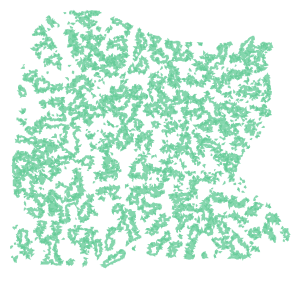

In [8]:
GF_L1 = GF_bin20[GF_bin20.obs["Layer"]=="L1"]
GF_points_l1 = GF_L1.obsm["spatial"]
GF_points_l1 = GF_points_l1.toarray().tolist()
GF_points_l1_res = alphashape.alphashape(GF_points_l1, alpha=0.03)
GF_points_l1_res.boundary

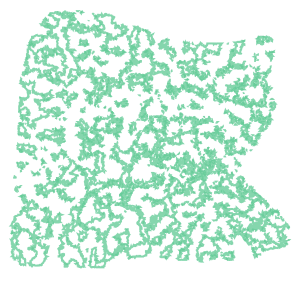

In [9]:
GF_L9 = GF_bin20[GF_bin20.obs["Layer"].isin(["L9"])]
GF_points_l9 = GF_L9.obsm["spatial"]
GF_points_l9 = GF_points_l9.toarray().tolist()
GF_points_l9_res = alphashape.alphashape(GF_points_l9, alpha=0.03)
GF_points_l9_res.boundary

In [11]:
SPF_bin20 = sc.read_h5ad("SPF_liver_bin20_add_score.h5ad")
SPF_bin20.obsm["spatial"] = SPF_bin20.obs.loc[:,["x", "y"]].values

SPFmeta = pd.read_csv("meta.data.SPF.layers.new.tsv", header=0, sep="\t", index_col=0)
SPF_bin20.obs[['Kuffer1','Plasma1', 'NKT1', 'DC1', 'Neu1','Lpl','Zbtb20',"Layer"]] = SPFmeta.loc[:,['Kuffer1', 'Plasma1','NKT1', 'DC1', 'Neu1','Lpl','Zbtb20',"Layer"]].reindex(SPF_bin20.obs.index)
SPF_bin20

AnnData object with n_obs × n_vars = 410282 × 23239
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'cell', 'x', 'y', 'Kuffer1', 'Plasma1', 'NKT1', 'NKT_raw1', 'Kuffer_raw1', 'Plasma_raw1', 'DC1', 'Neu1', 'DC_raw1', 'Neu_raw1', 'Lpl', 'Zbtb20', 'Layer'
    var: 'features'
    obsm: 'spatial'

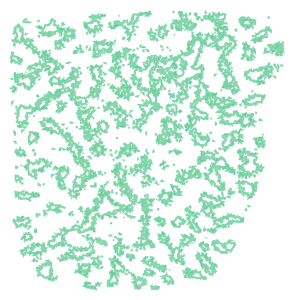

In [12]:
SPF_L1 = SPF_bin20[SPF_bin20.obs["Layer"]=="L1"]
SPF_points = SPF_L1.obsm["spatial"]
SPF_points = SPF_points.toarray().tolist()
SPF_points_res = alphashape.alphashape(SPF_points, alpha=0.03)
SPF_points_res.boundary

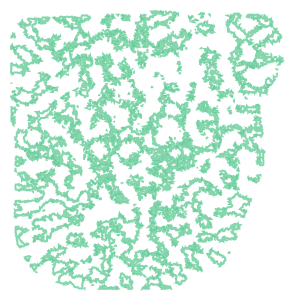

In [18]:
SPF_L9 = SPF_bin20[SPF_bin20.obs["Layer"].isin(["L9"])]
SPF_points_l9 = SPF_L9.obsm["spatial"]
SPF_points_l9 = SPF_points_l9.toarray().tolist()
SPF_points_l9_res = alphashape.alphashape(SPF_points_l9, alpha=0.03)
SPF_points_l9_res.boundary

###  kuffer 

In [13]:
GF_Kuffer_max = np.max(GF_bin20[GF_bin20.obs["Kuffer1"]!=0].obs["Kuffer1"])
SPF_Kuffer_max = np.max(SPF_bin20[SPF_bin20.obs["Kuffer1"]!=0].obs["Kuffer1"])
kuffer_max = np.max([GF_Kuffer_max, SPF_Kuffer_max])
kuffer_max

3.03365505391529

[0.  1.5 3. ]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

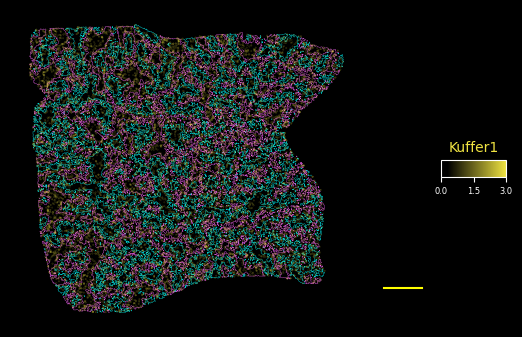

In [39]:
#plt.style.use("default")
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString



fig, ax = plot_spatial(adata=GF_bin20, color=["Kuffer1"], show_img=False, labels=["Kuffer1"], 
                          circle_diameter=0.3, alpha_scaling=1.0, max_col=(3, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))

# 获取路径
paths = shapely_to_paths(GF_points_l1_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.25, alpha=1, zorder=0)

paths_l9 = shapely_to_paths(GF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.25, alpha=1,zorder=0)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("GF_liver_kuffer.pdf")

[0.  1.5 3. ]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

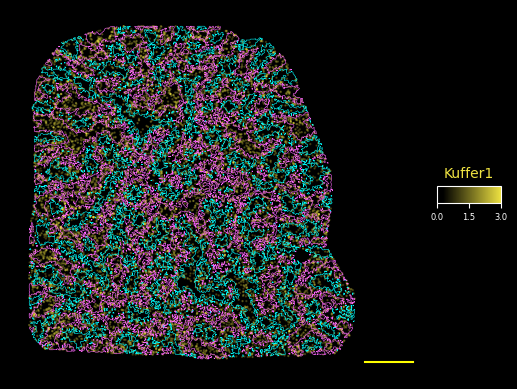

In [40]:
#plt.style.use("default")
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString


fig, ax = plot_spatial(adata=SPF_bin20, color=["Kuffer1"], show_img=False, labels=["Kuffer1"], 
                          circle_diameter=0.7, alpha_scaling=1.0, max_col=(3, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))



#获取路径
paths = shapely_to_paths(SPF_points_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.4, alpha=1)

paths_l9 = shapely_to_paths(SPF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.4, alpha=1)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("SPF_liver_kuffer.pdf")

### NK/T cell score 

In [49]:
GF_Kuffer_max = np.max(GF_bin20[GF_bin20.obs["NKT1"]!=0].obs["NKT1"])
SPF_Kuffer_max = np.max(SPF_bin20[SPF_bin20.obs["NKT1"]!=0].obs["NKT1"])
kuffer_max = np.max([GF_Kuffer_max, SPF_Kuffer_max])
kuffer_max

0.3354632958101

[0.   0.15 0.3 ]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

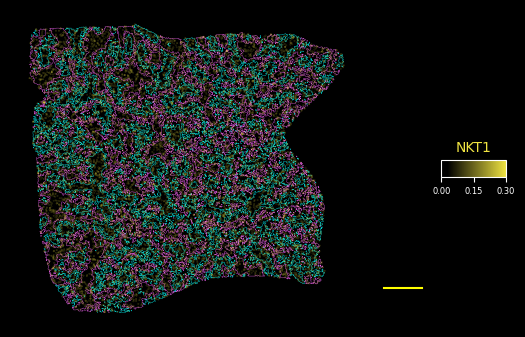

In [50]:
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString


fig, ax = plot_spatial(adata=GF_bin20, color=["NKT1"], show_img=False, labels=["NKT1"], 
                          circle_diameter=0.3, alpha_scaling=1.0, max_col=(0.3, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))

# 获取路径
paths = shapely_to_paths(GF_points_l1_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.25, alpha=1, zorder=0)

paths_l9 = shapely_to_paths(GF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.25, alpha=1,zorder=0)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("GF_liver_NKT.pdf")

[0.   0.15 0.3 ]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

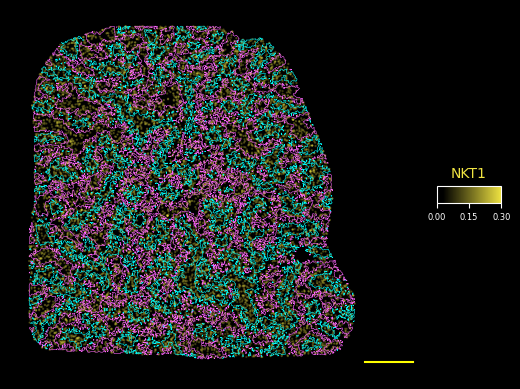

In [51]:
#plt.style.use("default")
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString


fig, ax = plot_spatial(adata=SPF_bin20, color=["NKT1"], show_img=False, labels=["NKT1"], 
                          circle_diameter=0.7, alpha_scaling=1.0, max_col=(0.3, np.inf, np.inf, np.inf, np.inf, np.inf,np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))



#获取路径
paths = shapely_to_paths(SPF_points_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.4, alpha=1)

paths_l9 = shapely_to_paths(SPF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.4, alpha=1)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("SPF_liver_NKT.pdf")

### Plasma score 

In [52]:
GF_Kuffer_max = np.max(GF_bin20[GF_bin20.obs["Plasma1"]!=0].obs["Plasma1"])
SPF_Kuffer_max = np.max(SPF_bin20[SPF_bin20.obs["Plasma1"]!=0].obs["Plasma1"])
kuffer_max = np.max([GF_Kuffer_max, SPF_Kuffer_max])
kuffer_max

2.75917513456637

[0.  1.4 2.8]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

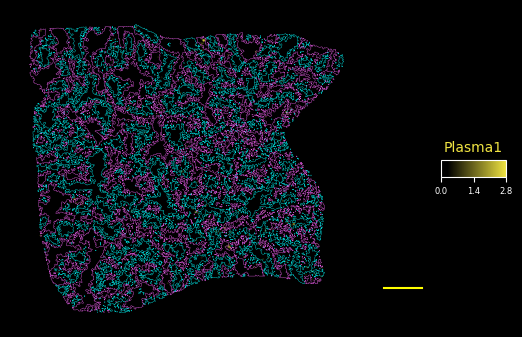

In [54]:
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString


fig, ax = plot_spatial(adata=GF_bin20, color=["Plasma1"], show_img=False, labels=["Plasma1"], 
                          circle_diameter=0.3, alpha_scaling=1.0, max_col=(2.8, np.inf, np.inf, np.inf, np.inf, np.inf, np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))

# 获取路径
paths = shapely_to_paths(GF_points_l1_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.25, alpha=1, zorder=0)

paths_l9 = shapely_to_paths(GF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.25, alpha=1,zorder=0)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("GF_liver_Plasma.pdf")

[0.  1.4 2.8]


/tmp/ipykernel_201/606115591.py:347: RuntimeWarning: invalid value encountered in true_divide
  weighted_colors_ryb = (colors_ryb * kernel_weights).sum(axis=1) / kernel_weights.sum(axis=1)


<Figure size 640x480 with 0 Axes>

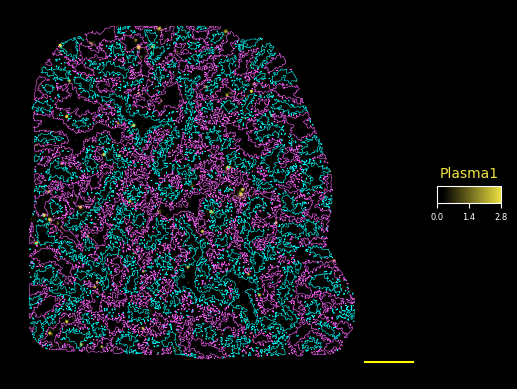

In [55]:
#plt.style.use("default")
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import MultiLineString


fig, ax = plot_spatial(adata=SPF_bin20, color=["Plasma1"], show_img=False, labels=["Plasma1"], 
                          circle_diameter=0.7, alpha_scaling=1.0, max_col=(2.8, np.inf, np.inf, np.inf, np.inf, np.inf,np.inf),
                            max_color_quantile=1,  img=None, img_alpha=0, adjust_text=True, plt_axis="off",
                            axis_y_flipped=True, x_y_labels=("", ""), text_box_alpha=0.9, reorder_cmap=[0], style="fast",
                            colorbar_position="right", colorbar_label_kw={"size":10}, colorbar_shape={}, colorbar_tick_size=6,
                            colorbar_grid=[1,1], white_spacing=10)#, image_cmap="Greys_r"

def shapely_to_paths(g):
    if isinstance(g, MultiLineString):
        return [list(ls.coords) for ls in g.geoms]
    else:
        raise Exception('unhandled shapely geometry: %s' % type(g))



#获取路径
paths = shapely_to_paths(SPF_points_res.boundary)
# 遍历路径并添加到图表中
for path in paths:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="cyan", linewidth=0.4, alpha=1)

paths_l9 = shapely_to_paths(SPF_points_l9_res.boundary)
# 遍历路径并添加到图表中
for path in paths_l9:
    # 解包路径中的坐标
    x, y = zip(*path)
    # 绘制线条
    ax.plot(x, y, color="#FF66FF", linewidth=0.4, alpha=1)

point0 = [20000, 20000]
point1 = [22000, 20000]
ax.plot([point0[0], point1[0]], [point0[1], point1[1]], color='yellow', linestyle="-")
plt.show()
plt.savefig("SPF_liver_Plasma.pdf")

# Figure 1G

In [11]:
# get number of enrich bin  # 
ReturnIndexScore <- function(data,num){
    lst <- list()
    for(i in names(data)){ # get a list of name 
        if(length(data[[i]]) >= num){ # 
            lst[[i]] <- length(data[[i]]) # get number of each name of > num 
        }    
    }
    score <- do.call(sum,lst)
    return(score)
}  
# stat radio # 
##  idx : colnames of index of txt file # 
DoStat <- function(file,input,idx,num){
    for(i in 1:nrow(file)){
        pfx <- paste(file$Mice[i],file$Tissue[i],sep = "_")
        #print(pfx)
        # enrich # enrich bin 
        f <- paste(input,"/",file[,idx][i],sep = "")
        dat <- readRDS(f)
        # stat #
        file$enrich[i] <- ReturnIndexScore(data = dat,num = num)
    }
    file <- file %>% select(Mice,Tissue,enrich,whole) %>% group_by(Mice,Tissue) %>% 
                       summarise(enrich = sum(enrich),whole = sum(whole)) %>%  #  # merge same tissue  
                       as.data.frame() %>% mutate(ratio = enrich/whole * 100)
    return(file)
}
# get order of x axis  # 
GetOrderIndex <- function(data,index,order,title = 'Aggregates index >= 2 spots'){
  lst <- list()
  for(i in unique(data[,index])){
    #print(i)
    dat <- data %>% filter(.data[[index]] == i)
    lst[[i]] <- data.frame(index = i, order = max(dat[,order]))
  }
  lst
  me <- do.call(rbind,lst) %>% arrange(order)
  return(me)
}
# Fisher Test # 
FisherTest <- function(data,tissue){
   data.list <- list()
   for(i in tissue){
         #print(i)
         yp <- 1
         dat <- data %>% filter(Tissue == i) %>% select(Mice,enrich,whole)
         rownames(dat) <- dat$Mice
         dat$Mice <- NULL 
         value <- fisher.test(as.matrix(dat))
         dat <- data.frame(Tissue = i , pvalue = value$p.value)
         data.list[[i]] <- dat
     }
    wdata <- do.call(rbind,data.list)
    return(wdata)
}
# calu table to add singal and adjust y axis # 
GetYPosition <- function(data,idx,signif,g1 = -0.2,g2 = 0.2,ylen = 0,
                         cut = c(0, 1e-04, 0.001, 0.01, 0.05, 1)){
    yl <- c()
    group1 <- c()
    group2 <- c()
    for(i in levels(data[,idx])){
        #print(i)
        y <- max(data[data[,idx] == i,]$ratio) + ylen 
        yl <- c(yl,y)
        g1 <- g1 + 1
        group1 <- c(group1,g1)
        g2 <- g2 + 1
        group2 <- c(group2,g2)
    }
    dat <- data.frame(Tissue = levels(data[,idx]),y.position = yl,
                     group1 = group1, group2 = group2 )
    #print(dat)
    signif <-  signif  %>% add_significance(cutpoints = cut)
    signif <- signif %>% left_join(dat,by = "Tissue")
    return(signif)
}
# barplot # 
Barplot_custom <- function(data,signif,title = title){
    theme_self <- theme(plot.title = element_text(size = 21,face = "bold",vjust = 0.5,hjust = 0.5),
                      axis.title.y = element_text(size = 20,margin = unit(c(0,0.5,0,0),"cm"),
                                                 face = "bold"),
                      axis.text.y = element_text(size = 18,face = "bold"),
                      axis.text.x = element_text(size = 18,vjust = 1,hjust = 1,angle = 45,face = "bold"),
                      legend.title= element_text(size=18,face = "bold"),
                      legend.text = element_text(size = 17), 
                      plot.margin = unit(c(0.5,1,0.5,0.5),"cm"))
    mycolor <- c("#7569a8","#c79733")
    p <- ggbarplot(data,x = "Tissue", y = "ratio",fill = "Mice",
                   palette = mycolor,position = position_dodge(0.8)) + theme_classic()  + theme_self +  
       labs(x = '', y = 'Proportion of cell \n aggregates %',title = title)  
    
    p2 <- p + stat_pvalue_manual(data = signif,# x = "Mice",f
                               label = "pvalue.signif",y.position = "y.position",size = 6) + 
                theme(strip.background = element_blank(),strip.text =  element_text(size = 15))  
    return(p2)
}

In [153]:
### mac ### 

In [19]:
level <- c('Ileum','Liver','Thymus','Colon','Spleen')
mac <- read.csv("mac.txt",sep = "\t")
mac <- mac[mac$Tissue %in% level,]
mac

,Mice,Tissue,file,whole
,<chr>,<chr>,<chr>,<int>
2,GF,Colon,gf_col1_mac_grp.txt,22438
3,GF,Ileum,gf_ile1_mac_grp.txt,4703
4,GF,Ileum,gf_ile2_mac_grp.txt,3163
5,GF,Liver,gf_liv_mac_grp.txt,511205
6,GF,Spleen,gf_spl_mac_grp.txt,45872
7,GF,Thymus,gf_thy_mac_grp.txt,97184
9,SPF,Colon,spf_col1_mac_grp.txt,27369
10,SPF,Ileum,spf_ile1_mac_grp.txt,5191
11,SPF,Ileum,spf_ile2_mac_grp.txt,3395


In [20]:
mac_30 <- DoStat(file = mac,num =30,idx = "file",
               input = "/data/work/08_plot/Figure1")
mac_30$Tissue <- factor(mac_30$Tissue,levels = level)
mac_30_pvalue <- FisherTest(data = mac_30,tissue = level)
mac_30_signal = GetYPosition(data = mac_30,idx = "Tissue",signif = mac_30_pvalue,ylen = 0.04)
p_mac_30 <- Barplot_custom(data = mac_30,signif = mac_30_signal,title = "Macroophage \n >= 30 spots")

`summarise()` has grouped output by 'Mice'. You can override using the
`.groups` argument.


In [79]:
### plasma ###

In [21]:
level <- c('Liver','Thymus','Spleen','Ileum','Colon')
plasma <- read.csv("plasma.txt",sep = "\t")
plasma <- plasma[plasma$Tissue %in% level,]
plasma

,Mice,Tissue,file,whole
,<chr>,<chr>,<chr>,<int>
2,GF,Colon,gf_col1_grp.txt,22438
3,GF,Ileum,gf_ile1_grp.txt,4703
4,GF,Ileum,gf_ile2_grp.txt,3163
5,GF,Liver,gf_liv_grp.txt,511205
6,GF,Spleen,gf_spl_grp.txt,45872
7,GF,Thymus,gf_thy_grp.txt,97184
9,SPF,Colon,spf_col1_grp.txt,27369
10,SPF,Ileum,spf_ile1_grp.txt,5191
11,SPF,Ileum,spf_ile2_grp.txt,3395


In [22]:
plasma_30 <- DoStat(file = plasma,num =30,idx = "file",
               input = "/data/work/08_plot/Figure1")
plasma_30$Tissue <- factor(plasma_30$Tissue,levels = level)
plasma_30_pvalue <- FisherTest(data =plasma_30,tissue = level)
plasma_30_signal = GetYPosition(data =plasma_30,idx = "Tissue",signif = plasma_30_pvalue,ylen = 3)
p_plasma_30 <- Barplot_custom(data = plasma_30,signif = plasma_30_signal,
                              title = "plasma cell \n aggregates index >= 30 spots")

`summarise()` has grouped output by 'Mice'. You can override using the
`.groups` argument.


In [23]:
plasma_500 <- DoStat(file = plasma,num =500,idx = "file",
               input = "/data/work/08_plot/Figure1")
plasma_500$Tissue <- factor(plasma_500$Tissue,levels = level)
plasma_500_pvalue <- FisherTest(data =plasma_500,tissue = level)
plasma_500_signal = GetYPosition(data =plasma_500,idx = "Tissue",signif = plasma_500_pvalue,ylen = 1.2)
p_plasma_500 <- Barplot_custom(data = plasma_500,signif = plasma_500_signal,
                               title = "plasma cell \n >= 500 spots")

`summarise()` has grouped output by 'Mice'. You can override using the
`.groups` argument.


In [24]:
plasma_1000 <- DoStat(file = plasma,num =1000,idx = "file",
               input = "/data/work/08_plot/Figure1")
plasma_1000$Tissue <- factor(plasma_1000$Tissue,levels = level)
plasma_1000_pvalue <- FisherTest(data =plasma_1000,tissue = level)
plasma_1000_signal = GetYPosition(data =plasma_1000,idx = "Tissue",signif = plasma_1000_pvalue,ylen = 1.2)
p_plasma_1000 <- Barplot_custom(data = plasma_1000,signif = plasma_1000_signal,
                                title = "plasma cell \n >= 1000 spots")

`summarise()` has grouped output by 'Mice'. You can override using the
`.groups` argument.


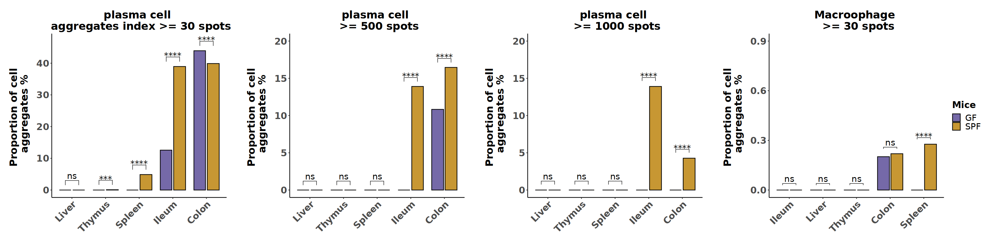

In [25]:
options(repr.plot.width = 28,repr.plot.height= 7)
p <- p_plasma_30  + p_plasma_500 + ylim(0,20) + p_plasma_1000 + ylim(0,20) + p_mac_30 + 
            scale_y_continuous(limits=c(0,0.9), breaks=seq(0,0.9,0.3)) + 
       plot_layout(ncol =4,guides = 'collect')
p

In [26]:
pdf(file = "Figure_1G_aggregate_index.pdf",w = 28,h = 7)
print(p)
dev.off()

png 
  2